In [271]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import GridSearchCV
from sklearn.multioutput import MultiOutputRegressor


import itertools


In [272]:
import openpyxl
print(openpyxl.__version__)


3.1.5


##### Importing model for forecasting --> using xgboost

In [273]:
import xgboost as xgb


In [274]:
df=pd.read_csv('datasets/Kathmandu_historical_aqi_2023-01-01_to_2025-03-06.csv')

In [275]:
df.head()

,timestamp,aqi,co,no,no2,o3,so2,pm2_5,pm10,nh3
0,2022-12-31,300,761.0,0.0,12.7,61.5,5.4,69.1,88.1,2.7
1,2023-01-01,400,1001.4,0.2,15.8,46.3,4.8,88.2,115.4,3.6
2,2023-01-02,400,2336.5,0.2,38.0,22.5,12.0,193.2,255.4,13.8
3,2023-01-03,400,2309.8,0.4,37.9,36.5,19.8,206.6,268.6,26.5
4,2023-01-04,400,2523.4,0.1,35.8,62.6,13.0,229.8,304.2,26.8


In [276]:
df.tail()

,timestamp,aqi,co,no,no2,o3,so2,pm2_5,pm10,nh3
789,2025-03-01,400,851.2,0.0,14.8,44.0,4.7,41.3,69.8,10.7
790,2025-03-02,300,834.4,0.0,15.2,65.8,4.8,36.2,63.5,20.1
791,2025-03-03,400,961.3,0.0,20.0,63.3,5.9,49.0,97.8,24.2
792,2025-03-04,400,994.7,0.0,22.0,64.4,6.0,54.2,118.0,28.9
793,2025-03-05,400,721.0,0.1,11.0,115.9,4.2,53.9,82.8,12.8


In [277]:
df.drop_duplicates()

,timestamp,aqi,co,no,no2,o3,so2,pm2_5,pm10,nh3
0,2022-12-31,300,761.0,0.0,12.7,61.5,5.4,69.1,88.1,2.7
1,2023-01-01,400,1001.4,0.2,15.8,46.3,4.8,88.2,115.4,3.6
2,2023-01-02,400,2336.5,0.2,38.0,22.5,12.0,193.2,255.4,13.8
3,2023-01-03,400,2309.8,0.4,37.9,36.5,19.8,206.6,268.6,26.5
4,2023-01-04,400,2523.4,0.1,35.8,62.6,13.0,229.8,304.2,26.8
...,...,...,...,...,...,...,...,...,...,...
789,2025-03-01,400,851.2,0.0,14.8,44.0,4.7,41.3,69.8,10.7
790,2025-03-02,300,834.4,0.0,15.2,65.8,4.8,36.2,63.5,20.1
791,2025-03-03,400,961.3,0.0,20.0,63.3,5.9,49.0,97.8,24.2
792,2025-03-04,400,994.7,0.0,22.0,64.4,6.0,54.2,118.0,28.9


In [278]:
df= df.rename(columns={'timestamp':'date'})

In [279]:
df.head()

,date,aqi,co,no,no2,o3,so2,pm2_5,pm10,nh3
0,2022-12-31,300,761.0,0.0,12.7,61.5,5.4,69.1,88.1,2.7
1,2023-01-01,400,1001.4,0.2,15.8,46.3,4.8,88.2,115.4,3.6
2,2023-01-02,400,2336.5,0.2,38.0,22.5,12.0,193.2,255.4,13.8
3,2023-01-03,400,2309.8,0.4,37.9,36.5,19.8,206.6,268.6,26.5
4,2023-01-04,400,2523.4,0.1,35.8,62.6,13.0,229.8,304.2,26.8


In [280]:
df.columns

Index(['date', 'aqi', 'co', 'no', 'no2', 'o3', 'so2', 'pm2_5', 'pm10', 'nh3'], dtype='object')

In [281]:
#checking the datatype of the columns
df.dtypes

date      object
aqi        int64
co       float64
no       float64
no2      float64
o3       float64
so2      float64
pm2_5    float64
pm10     float64
nh3      float64
dtype: object

In [282]:
df.index

RangeIndex(start=0, stop=794, step=1)

In [283]:
# label the date column as intex column
df.set_index('date', inplace=True)

In [284]:
color_palette=sns.color_palette()

#### Train / Test split

In [285]:
#spliting to train and test split --> training data is upto 2023-01 and test data is after 2023-01
train = df.loc[df.index < '2024-01-01']
test = df.loc[df.index >= '2024-01-01']

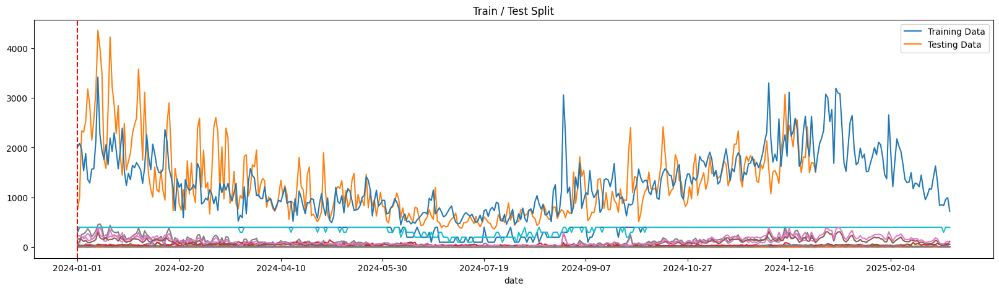

In [286]:
#plotting the train and test data
fig, ax = plt.subplots(figsize=(20,5))
train.plot(ax=ax, label='Training Set',title='Train / Test Split')
test.plot(ax=ax,label='Testing Set')
# add a line to show the split area
ax.axvline('2020-01-01',color='red',ls='--')
ax.legend(['Training Data','Testing Data'])
plt.show()

<Axes: title={'center': 'Monthly'}, xlabel='date'>

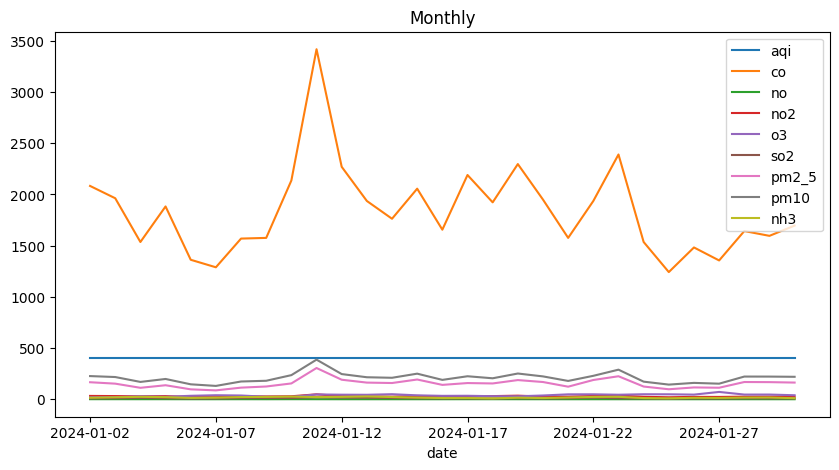

In [287]:
df.loc[(df.index > '2024-01-01')&(df.index < '2024-01-31')].plot(figsize=(10,5),title="Monthly")

#### Feature creation on time series data

In [288]:
# create time series features based on time series index
def make_some_feature(df):
    df= df.copy()
    df['daily']= df.index.day
    df['weekly']= df.index.dayofweek
    df['quarterly']= df.index.quarter
    df['monthly']=df.index.month
    df['yearly']=df.index.year 
    return df

In [289]:
df.index = pd.to_datetime(df.index)

In [290]:
df.index.day

Index([31,  1,  2,  3,  4,  5,  6,  7,  8,  9,
       ...
       24, 25, 26, 27, 28,  1,  2,  3,  4,  5],
      dtype='int32', name='date', length=794)

In [291]:
df_featured = make_some_feature(df)
df_featured

,aqi,co,no,no2,o3,so2,pm2_5,pm10,nh3,daily,weekly,quarterly,monthly,yearly
date,,,,,,,,,,,,,,
2022-12-31,300,761.0,0.0,12.7,61.5,5.4,69.1,88.1,2.7,31,5,4,12,2022
2023-01-01,400,1001.4,0.2,15.8,46.3,4.8,88.2,115.4,3.6,1,6,1,1,2023
2023-01-02,400,2336.5,0.2,38.0,22.5,12.0,193.2,255.4,13.8,2,0,1,1,2023
2023-01-03,400,2309.8,0.4,37.9,36.5,19.8,206.6,268.6,26.5,3,1,1,1,2023
2023-01-04,400,2523.4,0.1,35.8,62.6,13.0,229.8,304.2,26.8,4,2,1,1,2023
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-03-01,400,851.2,0.0,14.8,44.0,4.7,41.3,69.8,10.7,1,5,1,3,2025
2025-03-02,300,834.4,0.0,15.2,65.8,4.8,36.2,63.5,20.1,2,6,1,3,2025
2025-03-03,400,961.3,0.0,20.0,63.3,5.9,49.0,97.8,24.2,3,0,1,3,2025


### Feature / Target Relationship

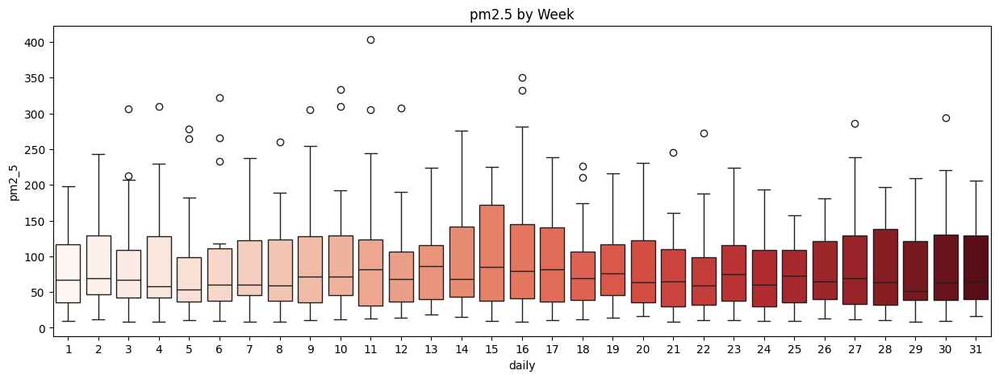

In [292]:

fig, ax = plt.subplots(figsize=(15,5))
sns.boxplot(data=df_featured, x='daily', y='pm2_5',palette='Reds', hue='daily', legend=False)
ax.set_title('pm2.5 by Week')
plt.show()

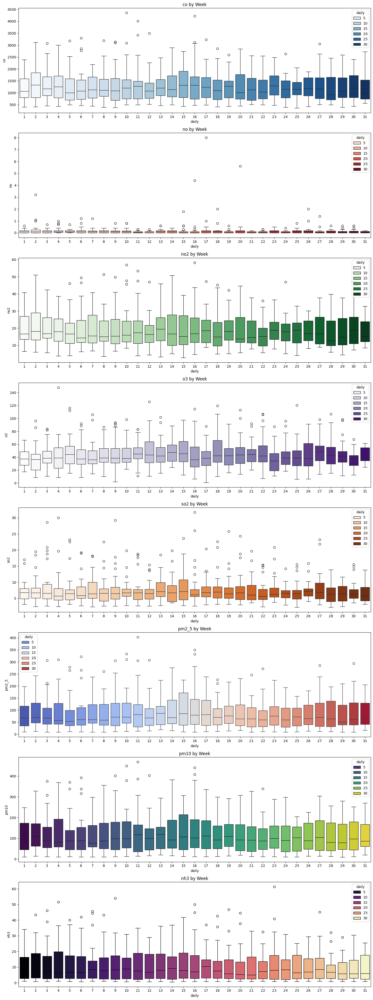

In [293]:

y_values = ['co', 'no', 'no2', 'o3', 'so2', 'pm2_5', 'pm10', 'nh3']
color_palettes = ['Blues', 'Reds', 'Greens', 'Purples', 'Oranges', 'coolwarm', 'viridis', 'magma', 'crest']

fig, axes = plt.subplots(nrows=len(y_values), figsize=(15, 5 * len(y_values)))

for ax, y, palette in zip(axes, y_values, color_palettes):
    sns.boxplot(data=df_featured, x='daily', y=y, palette=palette, hue='daily', ax=ax)
    ax.set_title(f'{y} by Week')

plt.tight_layout()
plt.show()


## Modelling
Creating a regression model using xgb

In [294]:
train.head()

,aqi,co,no,no2,o3,so2,pm2_5,pm10,nh3
date,,,,,,,,,
2022-12-31,300,761.0,0.0,12.7,61.5,5.4,69.1,88.1,2.7
2023-01-01,400,1001.4,0.2,15.8,46.3,4.8,88.2,115.4,3.6
2023-01-02,400,2336.5,0.2,38.0,22.5,12.0,193.2,255.4,13.8
2023-01-03,400,2309.8,0.4,37.9,36.5,19.8,206.6,268.6,26.5
2023-01-04,400,2523.4,0.1,35.8,62.6,13.0,229.8,304.2,26.8


In [295]:
train.index = pd.to_datetime(train.index)
test.index = pd.to_datetime(test.index)

In [296]:
train = make_some_feature(train)
test = make_some_feature(test)

In [297]:
# What are the features?
df_featured.columns


Index(['aqi', 'co', 'no', 'no2', 'o3', 'so2', 'pm2_5', 'pm10', 'nh3', 'daily',
       'weekly', 'quarterly', 'monthly', 'yearly'],
      dtype='object')

In [298]:
FEATURES = ['daily', 'weekly', 'quarterly', 'monthly', 'yearly']
TARGETS = ['co', 'no', 'no2', 'o3', 'so2', 'pm2_5', 'pm10', 'nh3']

In [299]:
# Creating a training and testing data set
X_train = train[FEATURES]
y_train = train[TARGETS]

X_test = test[FEATURES]
y_test = test[TARGETS]

In [300]:
# Standardize Features (Helps Tree-Based Models in Some Cases)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [301]:
# nEstimator sets the number of trees the boosted tree algorithm will create
# early_stopping_rounds determine when the model stops if there is no improvement
# reducing the learning rate reduce the chance of overfitting
# verbose => print out the training and validation score

# Store model results
results = []
models = {}

for target in TARGETS:
    #print(f"Training model for {target}...")

    # Extract target-specific training data
    y_train_target = y_train[target]
    y_test_target = y_test[target]

    # Define model with improved hyperparameters
    model = xgb.XGBRegressor(
        n_estimators=500,  # Reduce trees to prevent overfitting
        learning_rate=0.05,  # Increased for faster convergence
        max_depth=5,  # Controls complexity
        subsample=0.8,  # Prevents overfitting
        colsample_bytree=0.8,
        # early_stopping_rounds=50,
        random_state=42
    )

    # Train the model
    model.fit(X_train_scaled, y_train_target, eval_set=[(X_test_scaled, y_test_target)], verbose=10)

    # Store model
    models[target] = model

    # Make predictions
    y_pred = model.predict(X_test_scaled)

    # Calculate performance metrics
    mae = mean_absolute_error(y_test_target, y_pred)
    mse = mean_squared_error(y_test_target, y_pred)
    r2 = r2_score(y_test_target, y_pred)

    # Store results
    results.append({"Target": target, "MAE": mae, "MSE": mse, "R² Score": r2})

[0]	validation_0-rmse:564.57029
[10]	validation_0-rmse:433.05953
[20]	validation_0-rmse:394.06894
[30]	validation_0-rmse:395.41288
[40]	validation_0-rmse:406.76651
[50]	validation_0-rmse:419.63752
[60]	validation_0-rmse:433.55841
[70]	validation_0-rmse:445.73903
[80]	validation_0-rmse:452.29372
[90]	validation_0-rmse:463.26155
[100]	validation_0-rmse:468.61946
[110]	validation_0-rmse:474.35367
[120]	validation_0-rmse:479.30976
[130]	validation_0-rmse:484.11134
[140]	validation_0-rmse:487.82244
[150]	validation_0-rmse:489.15493
[160]	validation_0-rmse:491.29157
[170]	validation_0-rmse:494.10424
[180]	validation_0-rmse:496.53238
[190]	validation_0-rmse:499.08602
[200]	validation_0-rmse:500.20714
[210]	validation_0-rmse:501.74487
[220]	validation_0-rmse:502.20249
[230]	validation_0-rmse:503.70909
[240]	validation_0-rmse:505.47991
[250]	validation_0-rmse:506.22669
[260]	validation_0-rmse:507.29590
[270]	validation_0-rmse:507.77558
[280]	validation_0-rmse:508.72352
[290]	validation_0-rmse:5

In [302]:
# Create a DataFrame for results
results_df = pd.DataFrame(results)
print("\nModel Performance Summary:")
print(results_df)


Model Performance Summary:
  Target         MAE            MSE   R² Score
0     co  366.053222  273042.934070   0.203359
1     no    0.256726       0.334628 -12.312247
2    no2    5.497317      57.225002   0.356315
3     o3   17.901458     548.454532  -0.171520
4    so2    2.737365      15.139029   0.389387
5  pm2_5   32.446289    2356.671308   0.421062
6   pm10   38.855757    3244.894892   0.551347
7    nh3    5.873720      83.098484   0.324914


### Feature importance

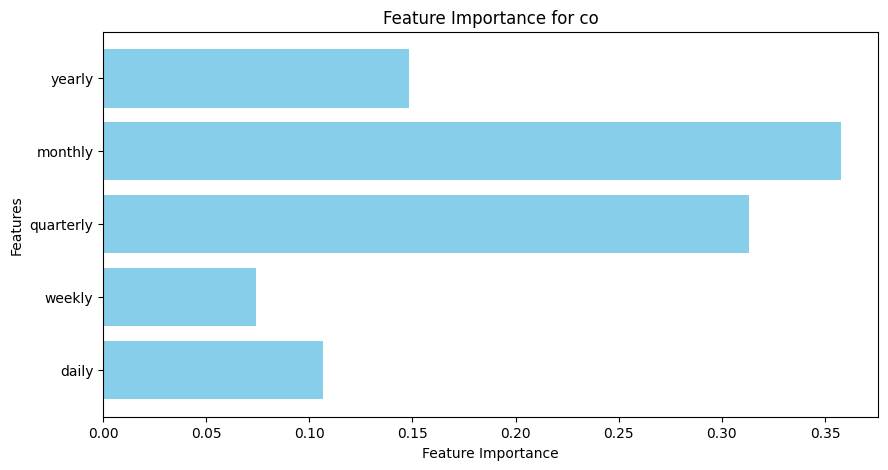

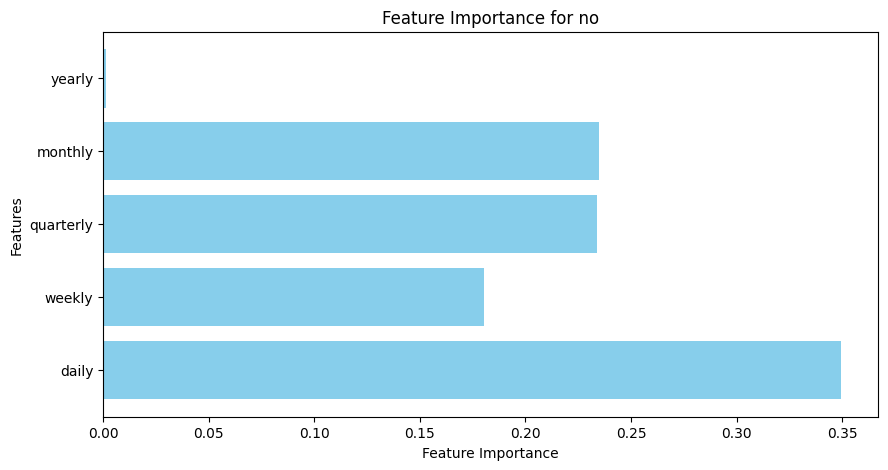

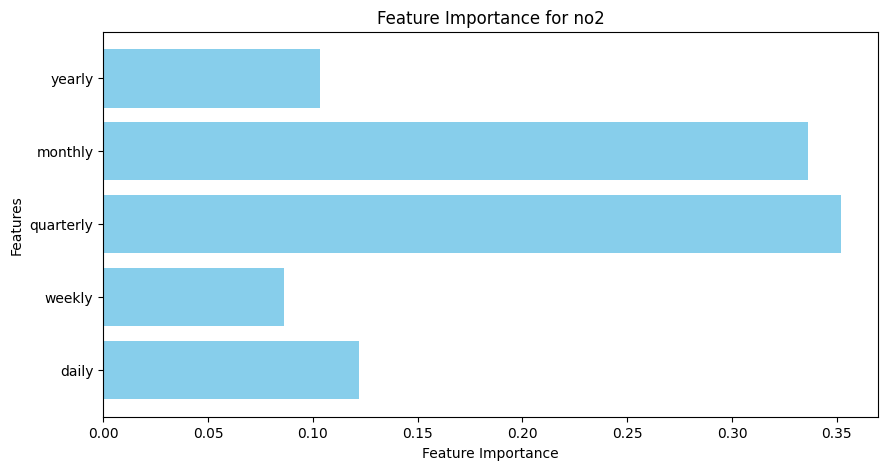

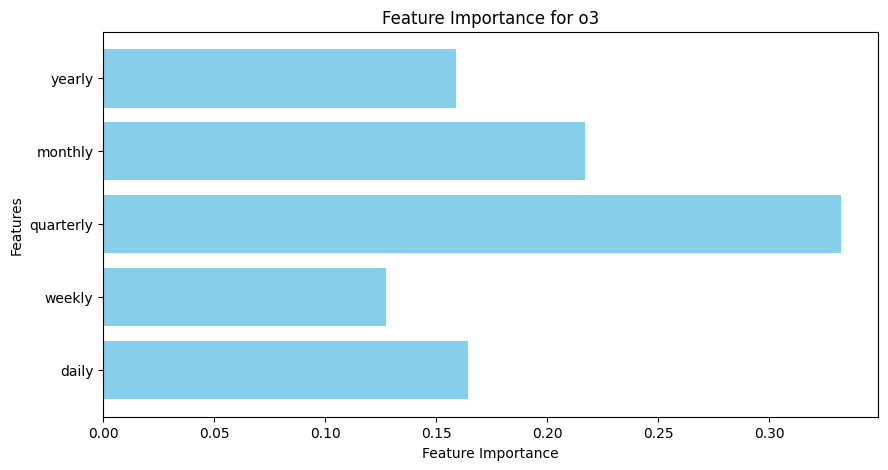

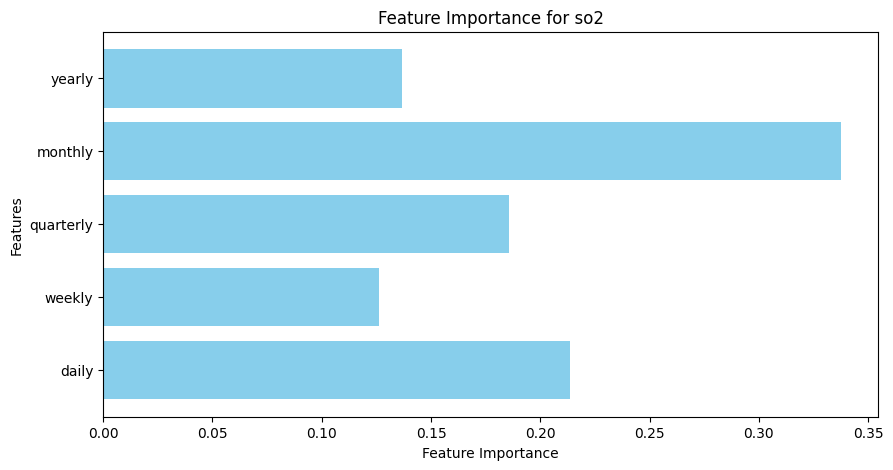

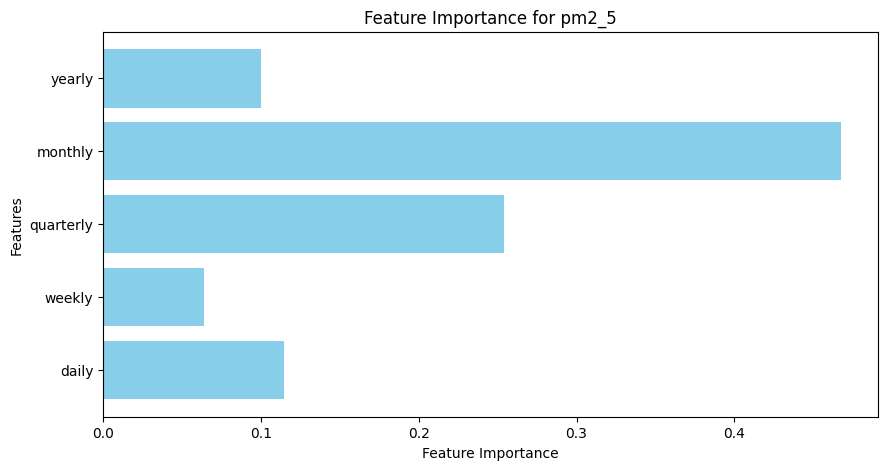

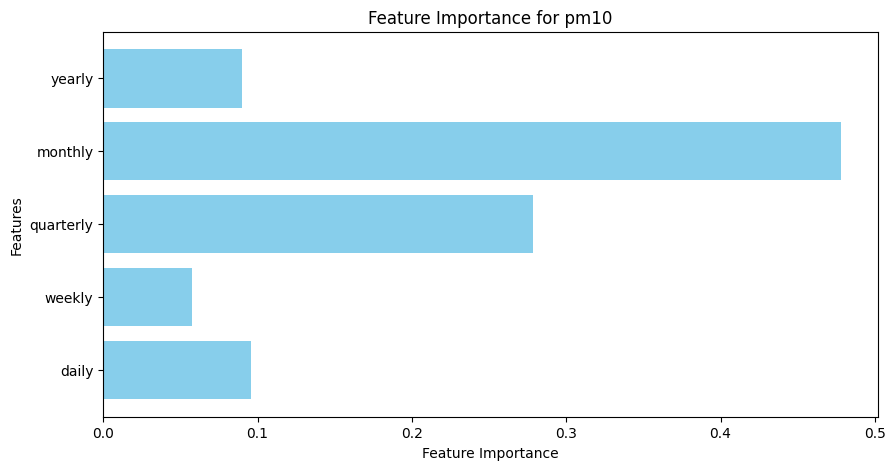

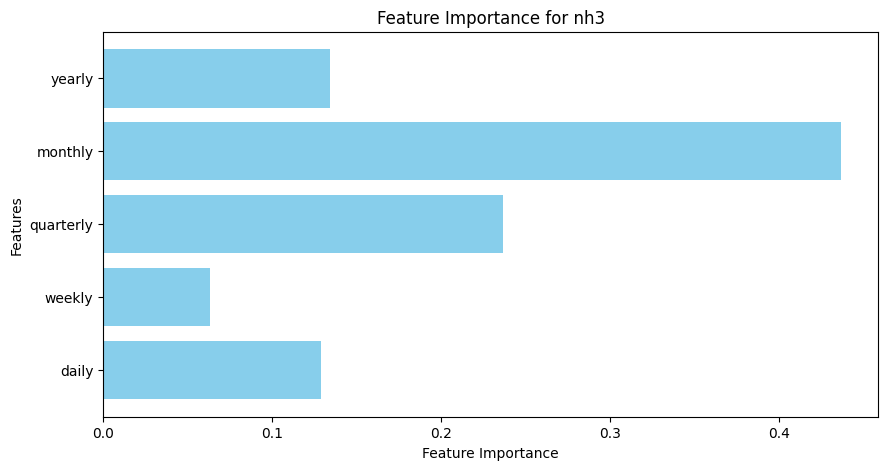

In [303]:
# Plot Feature Importance
for target in TARGETS:
    plt.figure(figsize=(10, 5))
    feature_importance = models[target].feature_importances_
    plt.barh(FEATURES, feature_importance, color='skyblue')
    plt.xlabel("Feature Importance")
    plt.ylabel("Features")
    plt.title(f"Feature Importance for {target}")
    plt.show()

In [304]:

# store feature importance for all targets

feature_importance_df = pd.DataFrame(columns=["Target"] + FEATURES)

# Extract feature importance for each target
for target in TARGETS:
    feature_importance = models[target].feature_importances_
    feature_importance_df = pd.concat(
        [feature_importance_df, pd.DataFrame([[target] + list(feature_importance)], 
                                             columns=["Target"] + FEATURES)]
    )

# Display the feature importance table
print("\n🔹 **Feature Importance Table:**")
print(feature_importance_df.set_index("Target"))



🔹 **Feature Importance Table:**
           daily    weekly  quarterly   monthly    yearly
Target                                                   
co      0.106486  0.074075   0.313149  0.357898  0.148392
no      0.349553  0.180461   0.233704  0.234869  0.001413
no2     0.122233  0.086190   0.352068  0.336287  0.103222
o3      0.164205  0.127282   0.332528  0.217202  0.158784
so2     0.213594  0.126197   0.185899  0.337676  0.136633
pm2_5   0.114312  0.064086   0.254048  0.467740  0.099813
pm10    0.095814  0.057738   0.278260  0.478196  0.089993
nh3     0.129093  0.063160   0.236732  0.436681  0.134335


C:\Users\Dell\AppData\Local\Temp\ipykernel_10052\620008516.py:8: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  feature_importance_df = pd.concat(


## Retrainig the model after finding and removing the weak features

In [305]:
# Remove weak features (yearly for 'no' & weekly for some)
FEATURES = ['daily', 'weekly', 'quarterly', 'monthly', 'yearly']
FEATURES_STRONG = ['daily', 'quarterly', 'monthly']  # Optimized feature list

# Update train & test datasets
X_train_optimized = X_train[FEATURES_STRONG]
X_test_optimized = X_test[FEATURES_STRONG]


In [306]:

# Define hyperparameter grid
param_grid = {
    "estimator__n_estimators": [200, 500, 1000],  
    "estimator__learning_rate": [0.01, 0.05, 0.1],  
    "estimator__max_depth": [5, 7, 10],  
    "estimator__subsample": [0.7, 0.8, 0.9],  
    "estimator__colsample_bytree": [0.7, 0.8, 0.9]  
}

# Initialize multi-output model
base_model = xgb.XGBRegressor(objective="reg:squarederror")
multi_output_model = MultiOutputRegressor(base_model)

# Perform Grid Search for the multi-output model
grid_search = GridSearchCV(multi_output_model, param_grid, cv=3, scoring="r2", verbose=1, n_jobs=-1)
grid_search.fit(X_train_optimized, y_train)

# Store best parameters
best_params = grid_search.best_params_
print(f"\n✅ Best parameters: {best_params}")


Fitting 3 folds for each of 243 candidates, totalling 729 fits

✅ Best parameters: {'estimator__colsample_bytree': 0.7, 'estimator__learning_rate': 0.01, 'estimator__max_depth': 5, 'estimator__n_estimators': 500, 'estimator__subsample': 0.7}


In [307]:
# Train the best model
best_model = MultiOutputRegressor(xgb.XGBRegressor(objective="reg:squarederror", **best_params))
best_model.fit(X_train_optimized, y_train)


c:\Users\Dell\miniconda3\Lib\site-packages\xgboost\core.py:158: UserWarning: [21:11:39] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-08cbc0333d8d4aae1-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "estimator__colsample_bytree", "estimator__learning_rate", "estimator__max_depth", "estimator__n_estimators", "estimator__subsample" } are not used.

  warnings.warn(smsg, UserWarning)
c:\Users\Dell\miniconda3\Lib\site-packages\xgboost\core.py:158: UserWarning: [21:11:39] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-08cbc0333d8d4aae1-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "estimator__colsample_bytree", "estimator__learning_rate", "estimator__max_depth", "estimator__n_estimators", "estimator__subsample" } are not used.

  warnings.warn(smsg, UserWarning)
c:\Users\Dell\miniconda3\Lib\site-packages\xgboost\core.py:158: UserWarning: [21:11:39] WARNING: C:\buildkite-agent\builds\buildkite-win

MultiOutputRegressor(estimator=XGBRegressor(base_score=None, booster=None,
                                            callbacks=None,
                                            colsample_bylevel=None,
                                            colsample_bynode=None,
                                            colsample_bytree=None, device=None,
                                            early_stopping_rounds=None,
                                            enable_categorical=False,
                                            estimator__colsample_bytree=0.7,
                                            estimator__learning_rate=0.01,
                                            estimator__max_depth=5,
                                            estimator__n_estimators=500,
                                            estimator__subsample=0.7,
                                            eval_metric=None,
                                            feature_types=None, gamma=None,
                                            grow_policy=None,
                                            importance_type=None,
                                            interaction_constraints=None,
                                            learning_rate=None, max_bin=None,
                                            max_cat_threshold=None,
                                            max_cat_to_onehot=None,
                                            max_delta_step=None, max_depth=None,
                                            max_leaves=None,
                                            min_child_weight=None, missing=nan,
                                            monotone_constraints=None, ...))

# Forcasting the data for the test data

In [308]:


# Predict on test set
y_pred = best_model.predict(X_test_optimized)

# Calculate metrics for each target
results = []
for i, target in enumerate(TARGETS):
    mae = mean_absolute_error(y_test.iloc[:, i], y_pred[:, i])
    mse = mean_squared_error(y_test.iloc[:, i], y_pred[:, i])
    r2 = r2_score(y_test.iloc[:, i], y_pred[:, i])
    
    results.append({"Target": target, "MAE": mae, "MSE": mse, "R² Score": r2})

# Convert to DataFrame and display results
results_df = pd.DataFrame(results)
print("\n🔹 **Final Model Performance Summary:**")
print(results_df)



🔹 **Final Model Performance Summary:**
  Target         MAE            MSE   R² Score
0     co  408.839804  343418.955437  -0.001973
1     no    0.242188       0.514350 -19.461960
2    no2    6.484191      79.628154   0.104317
3     o3   19.687110     670.618077  -0.432467
4    so2    3.144198      18.919548   0.236905
5  pm2_5   34.270911    2680.587856   0.341489
6   pm10   42.461005    3873.857623   0.464384
7    nh3    6.391851     101.152158   0.178247


In [309]:
best_model.predict(X_test_optimized)

array([[9.9737958e+02, 1.9908124e-01, 1.5730927e+01, ..., 8.8034401e+01,
        1.1550435e+02, 3.6036794e+00],
       [2.3374172e+03, 2.0544842e-01, 3.8060017e+01, ..., 1.9370306e+02,
        2.5565990e+02, 1.3929620e+01],
       [2.3202832e+03, 3.9345372e-01, 3.7856709e+01, ..., 2.0649152e+02,
        2.6860175e+02, 2.6526773e+01],
       ...,
       [1.2722200e+03, 1.4615773e-02, 1.7276484e+01, ..., 1.0088400e+02,
        1.2737297e+02, 7.2988992e+00],
       [1.8497448e+03, 9.4585545e-02, 2.4268507e+01, ..., 1.7480962e+02,
        2.1994406e+02, 6.2892566e+00],
       [1.2366658e+03, 1.0582189e-01, 1.7975063e+01, ..., 7.7284760e+01,
        1.1147901e+02, 1.6160797e+01]], shape=(430, 8), dtype=float32)

In [310]:
print(best_model.predict(X_test_optimized).shape)


(430, 8)


In [311]:
test[['predicted co', 'predicted no', 'predicted no2', 'predicted o3', 'predicted so2', 'predicted pm2_5', 'predicted pm10', 'predicted nh3']] = best_model.predict(X_test_optimized).reshape(-1, 8)


In [312]:
test[['predicted co', 'predicted no', 'predicted no2', 'predicted o3', 'predicted so2', 'predicted pm2_5', 'predicted pm10', 'predicted nh3']] = best_model.predict(X_test_optimized).reshape(-1, 8)


In [313]:
test

,aqi,co,no,no2,o3,so2,pm2_5,pm10,nh3,daily,...,monthly,yearly,predicted co,predicted no,predicted no2,predicted o3,predicted so2,predicted pm2_5,predicted pm10,predicted nh3
date,,,,,,,,,,,,,,,,,,,,,
2024-01-01,400,2016.0,0.2,30.5,21.8,9.6,167.0,227.4,15.8,1,...,1,2024,997.379578,0.199081,15.730927,46.245270,4.803388,88.034401,115.504349,3.603679
2024-01-02,400,2082.8,0.4,32.2,18.8,8.2,165.9,226.0,14.6,2,...,1,2024,2337.417236,0.205448,38.060017,22.088081,12.040138,193.703064,255.659897,13.929620
2024-01-03,400,1962.6,0.4,30.7,20.5,10.0,152.1,216.7,19.0,3,...,1,2024,2320.283203,0.393454,37.856709,37.024292,19.755360,206.491516,268.601746,26.526773
2024-01-04,400,1535.4,0.2,28.4,27.7,12.6,111.5,169.0,23.2,4,...,1,2024,2521.101318,0.103196,35.969852,61.974194,13.047080,230.019470,304.677094,26.810953
2024-01-05,400,1882.6,0.3,30.5,24.0,10.4,136.6,197.8,20.2,5,...,1,2024,3147.031982,0.006265,45.979156,54.681866,23.124268,276.749237,367.335266,40.053261
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-03-01,400,851.2,0.0,14.8,44.0,4.7,41.3,69.8,10.7,1,...,3,2025,2373.714600,0.098538,40.657955,40.047344,8.142096,174.296005,243.881012,34.097336
2025-03-02,300,834.4,0.0,15.2,65.8,4.8,36.2,63.5,20.1,2,...,3,2025,2597.063477,0.099176,45.215061,33.511711,10.855812,183.156204,251.436798,25.816278
2025-03-03,400,961.3,0.0,20.0,63.3,5.9,49.0,97.8,24.2,3,...,3,2025,1272.219971,0.014616,17.276484,82.001488,7.591571,100.884003,127.372971,7.298899


In [314]:
df_copy =df.copy()

In [315]:
df_copy=df_copy.merge(test[['predicted co', 'predicted no', 'predicted no2', 'predicted o3', 'predicted so2', 'predicted pm2_5', 'predicted pm10', 'predicted nh3']], how='left',left_index=True,right_index=True)

In [316]:
# since the prediction was done on data from 2025 onwords the data before that has NaN as predicted value
df_copy

,aqi,co,no,no2,o3,so2,pm2_5,pm10,nh3,predicted co,predicted no,predicted no2,predicted o3,predicted so2,predicted pm2_5,predicted pm10,predicted nh3
date,,,,,,,,,,,,,,,,,
2022-12-31,300,761.0,0.0,12.7,61.5,5.4,69.1,88.1,2.7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2023-01-01,400,1001.4,0.2,15.8,46.3,4.8,88.2,115.4,3.6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2023-01-02,400,2336.5,0.2,38.0,22.5,12.0,193.2,255.4,13.8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2023-01-03,400,2309.8,0.4,37.9,36.5,19.8,206.6,268.6,26.5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2023-01-04,400,2523.4,0.1,35.8,62.6,13.0,229.8,304.2,26.8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-03-01,400,851.2,0.0,14.8,44.0,4.7,41.3,69.8,10.7,2373.714600,0.098538,40.657955,40.047344,8.142096,174.296005,243.881012,34.097336
2025-03-02,300,834.4,0.0,15.2,65.8,4.8,36.2,63.5,20.1,2597.063477,0.099176,45.215061,33.511711,10.855812,183.156204,251.436798,25.816278
2025-03-03,400,961.3,0.0,20.0,63.3,5.9,49.0,97.8,24.2,1272.219971,0.014616,17.276484,82.001488,7.591571,100.884003,127.372971,7.298899


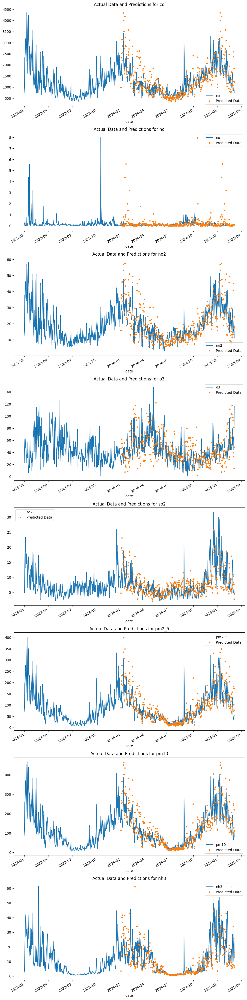

In [317]:
#Plotting predictions

# List of actual and predicted column pairs
y_values = ['co', 'no', 'no2', 'o3', 'so2', 'pm2_5', 'pm10', 'nh3']  # Add more if needed

fig, axes = plt.subplots(nrows=len(y_values), figsize=(10, 5 * len(y_values)))

# If there's only one subplot, make axes a list for consistency
if len(y_values) == 1:
    axes = [axes]

for ax, y in zip(axes, y_values):
    df_copy[[y]].plot(ax=ax, style='-', label='Actual Data')  # Line for actual data
    df_copy[f'predicted {y}'].plot(ax=ax, style='.', label='Predicted Data')  # Dots for predictions

    ax.set_title(f'Actual Data and Predictions for {y}')
    ax.legend()

plt.tight_layout()
plt.show()


In [318]:
df_copy.tail()

,aqi,co,no,no2,o3,so2,pm2_5,pm10,nh3,predicted co,predicted no,predicted no2,predicted o3,predicted so2,predicted pm2_5,predicted pm10,predicted nh3
date,,,,,,,,,,,,,,,,,
2025-03-01,400,851.2,0.0,14.8,44.0,4.7,41.3,69.8,10.7,2373.714600,0.098538,40.657955,40.047344,8.142096,174.296005,243.881012,34.097336
2025-03-02,300,834.4,0.0,15.2,65.8,4.8,36.2,63.5,20.1,2597.063477,0.099176,45.215061,33.511711,10.855812,183.156204,251.436798,25.816278
2025-03-03,400,961.3,0.0,20.0,63.3,5.9,49.0,97.8,24.2,1272.219971,0.014616,17.276484,82.001488,7.591571,100.884003,127.372971,7.298899
2025-03-04,400,994.7,0.0,22.0,64.4,6.0,54.2,118.0,28.9,1849.744751,0.094586,24.268507,14.077171,2.751152,174.809616,219.944061,6.289257
2025-03-05,400,721.0,0.1,11.0,115.9,4.2,53.9,82.8,12.8,1236.665771,0.105822,17.975063,48.550713,4.500097,77.284760,111.479012,16.160797


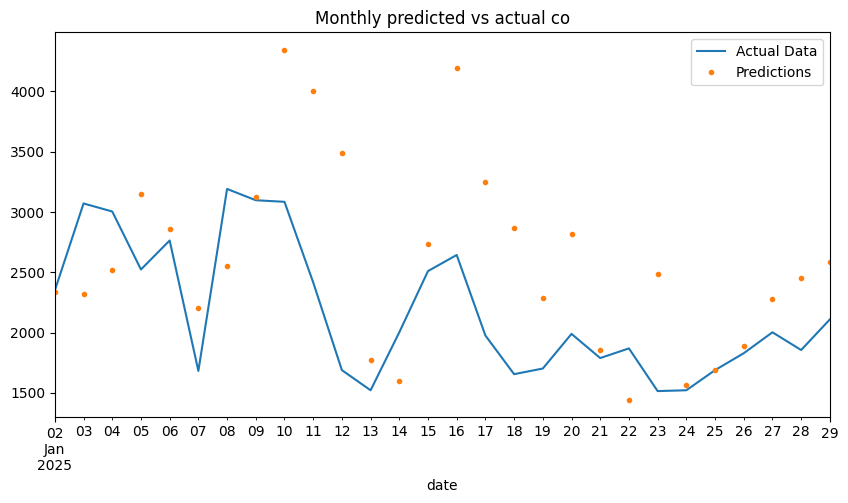

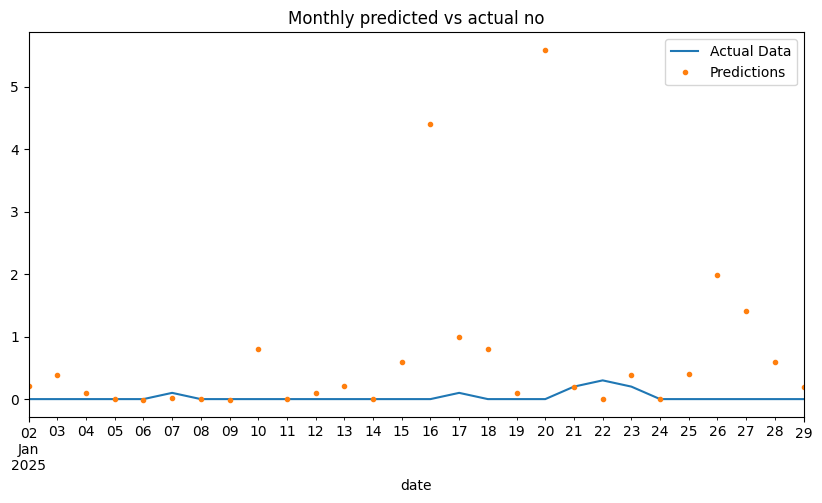

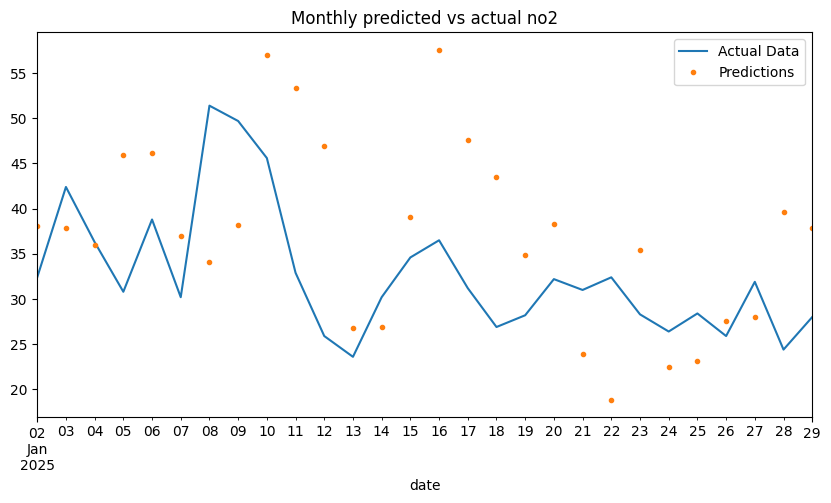

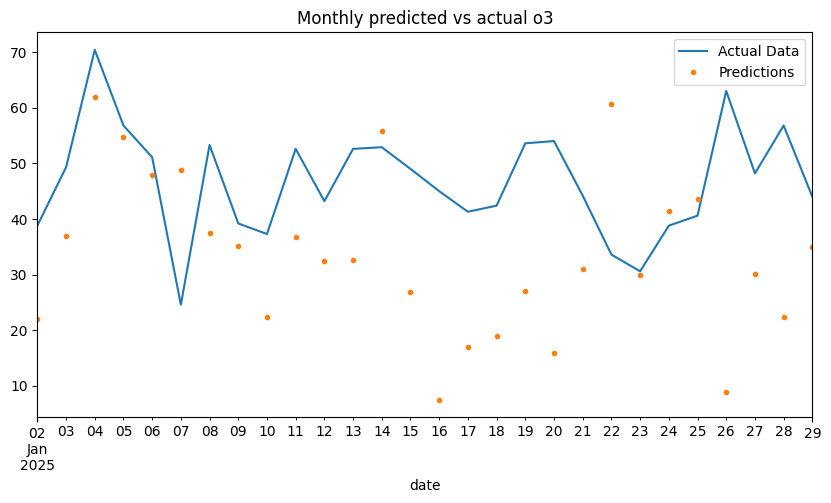

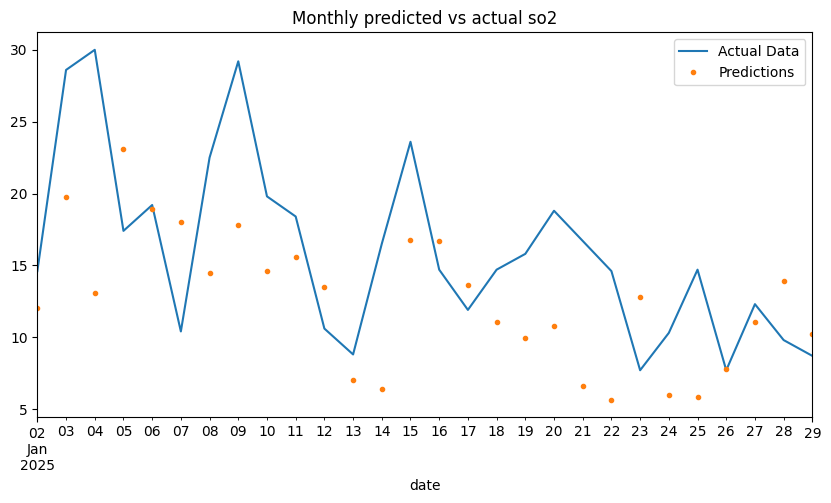

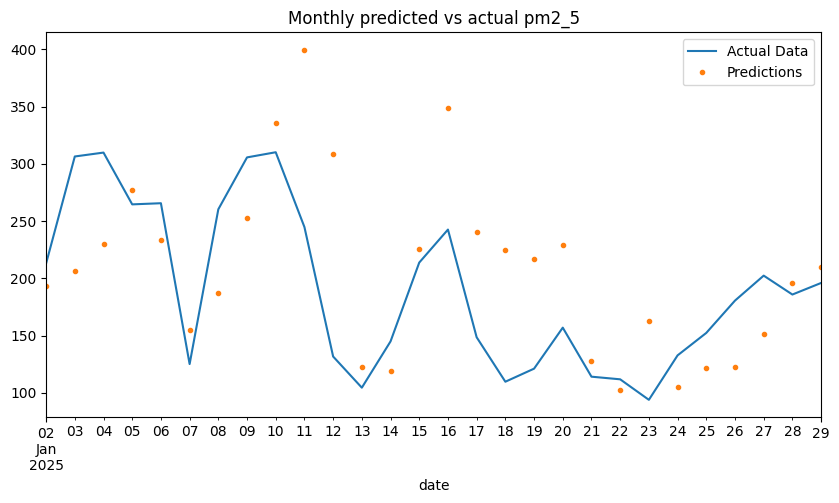

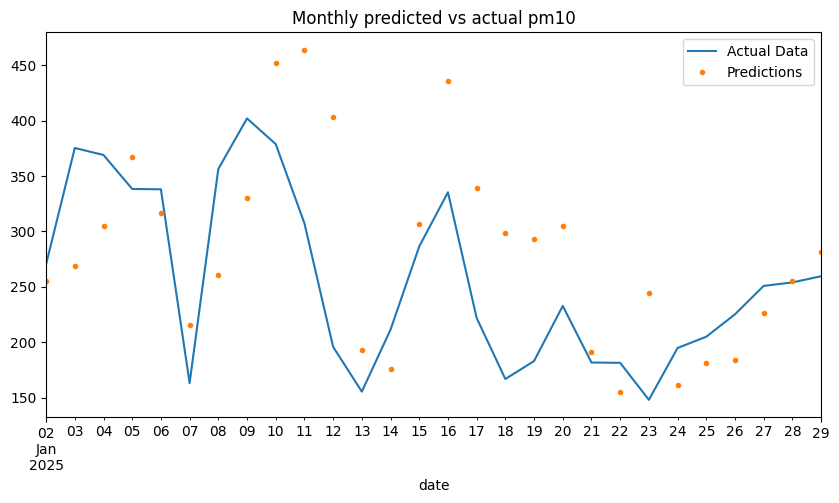

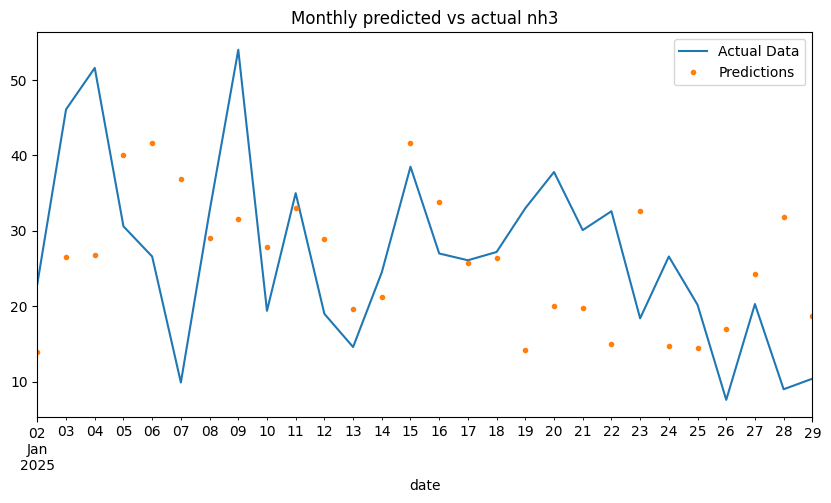

In [319]:
import matplotlib.pyplot as plt

# Define the date range
start_date = '2025-01-01'
end_date = '2025-01-30'

# Loop through all target variables
for target in TARGETS:
    plt.figure(figsize=(10, 5))
    
    # Plot actual data
    df_copy.loc[(df_copy.index > start_date) & (df_copy.index < end_date)][target].plot(title=f"Monthly predicted vs actual {target}")
    
    # Plot predicted data
    df_copy.loc[(df_copy.index > start_date) & (df_copy.index < end_date)][f'predicted {target}'].plot(style='.')
    
    # Add legend and show plot
    plt.legend(['Actual Data', 'Predictions'])
    plt.show()


## Outlier Analysis

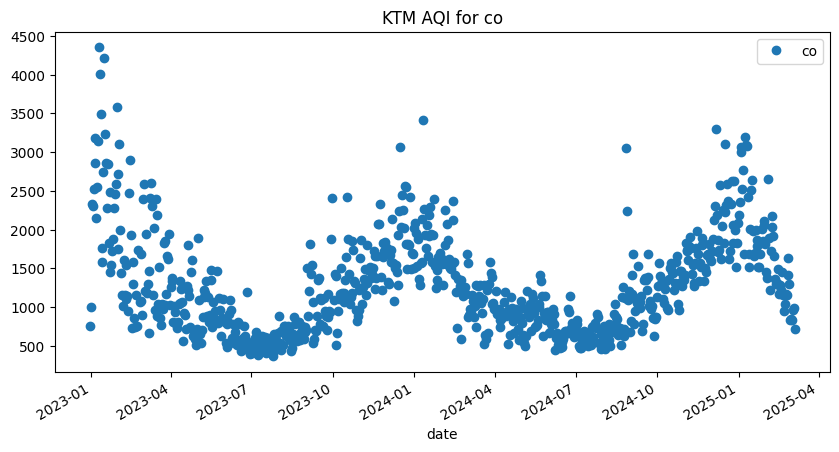

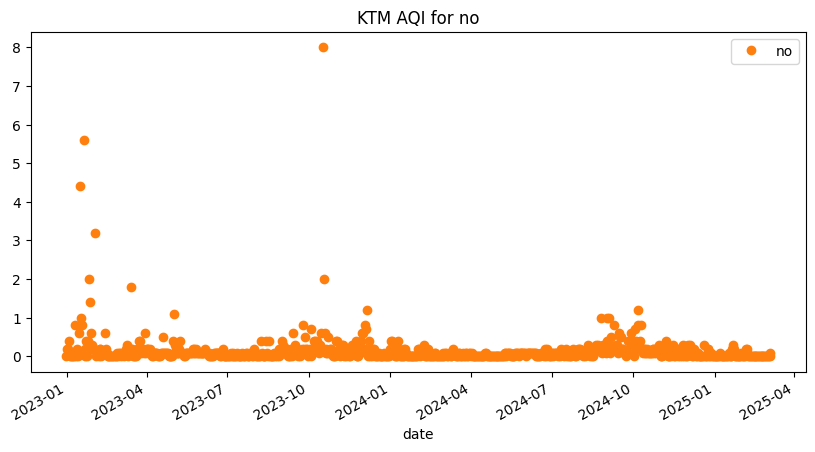

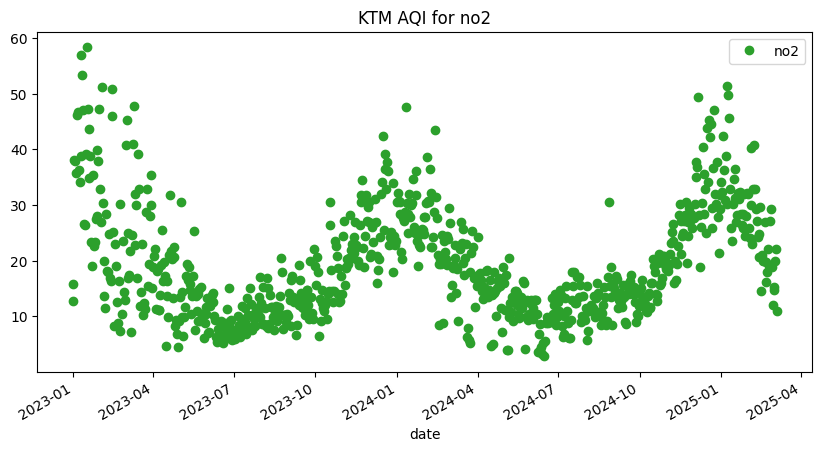

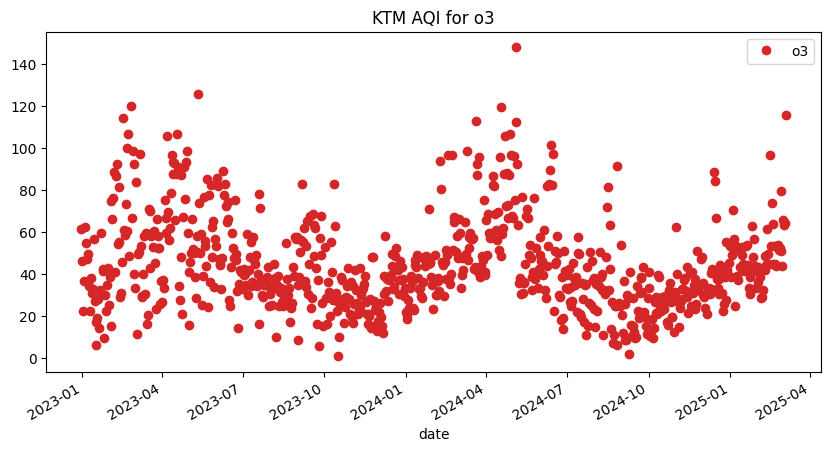

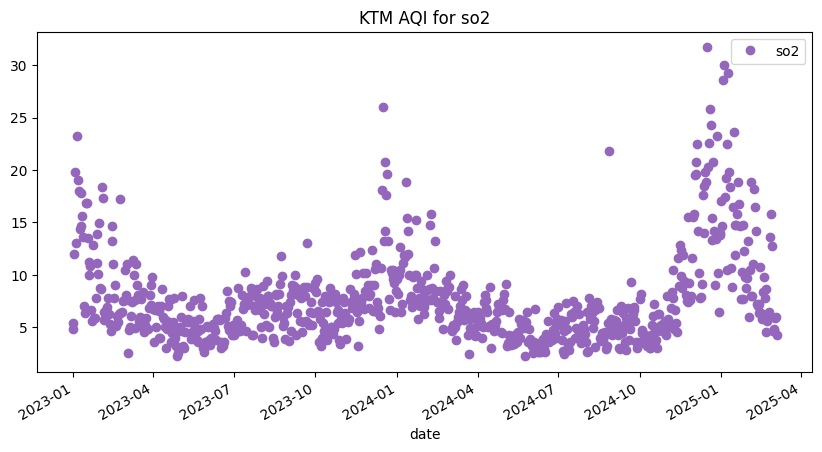

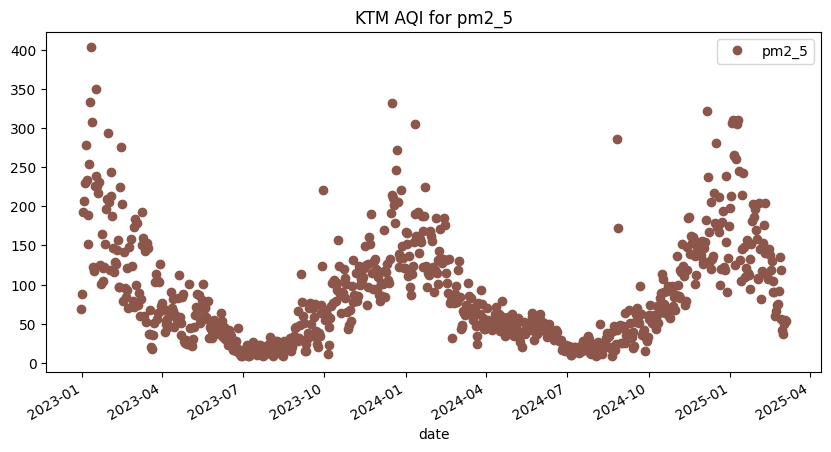

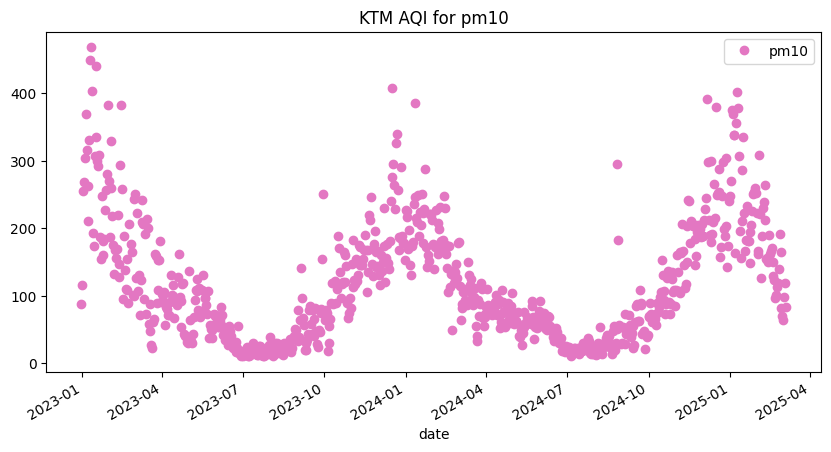

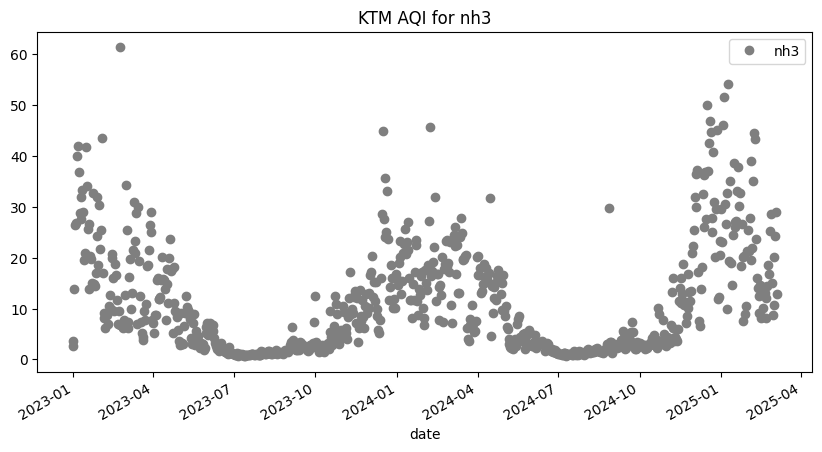

In [320]:

# Loop through all target variables and create separate plots
for i, target in enumerate(TARGETS):
    plt.figure(figsize=(10, 5))
    
    df[target].plot(style='o', color=color_palette[i], title=f'KTM AQI for {target}')
    
    plt.legend([target])
    plt.show()


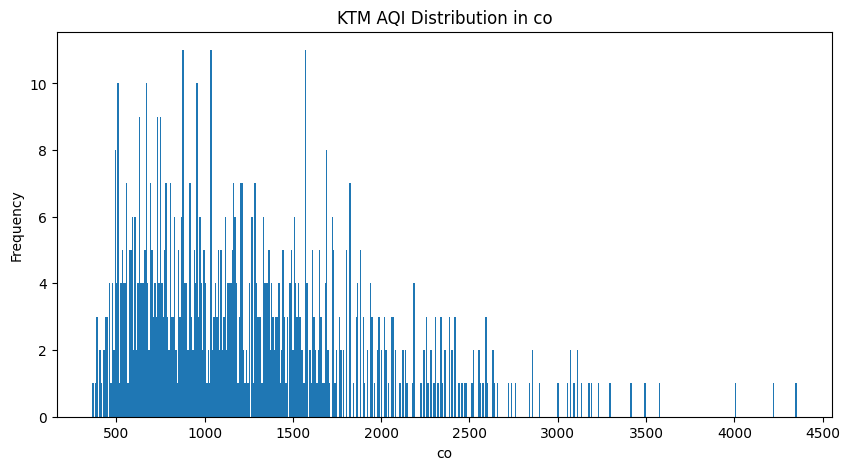

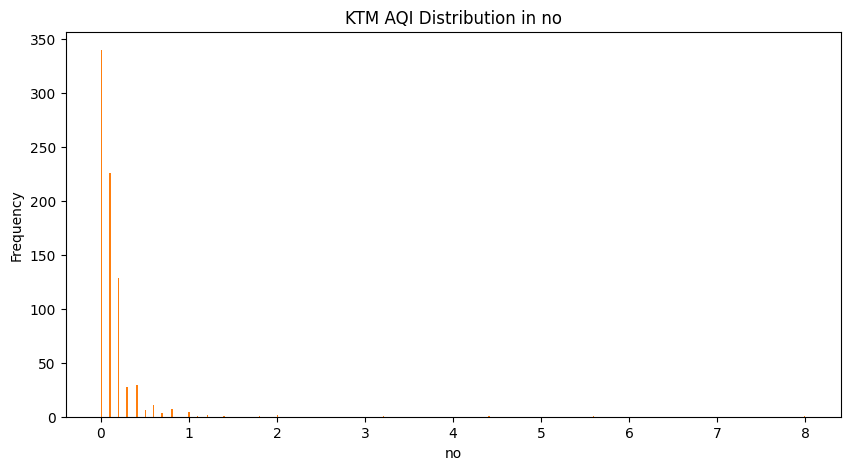

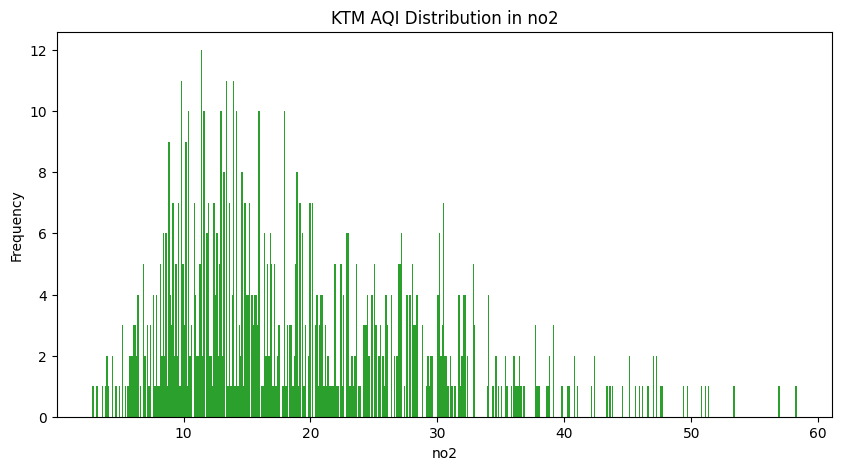

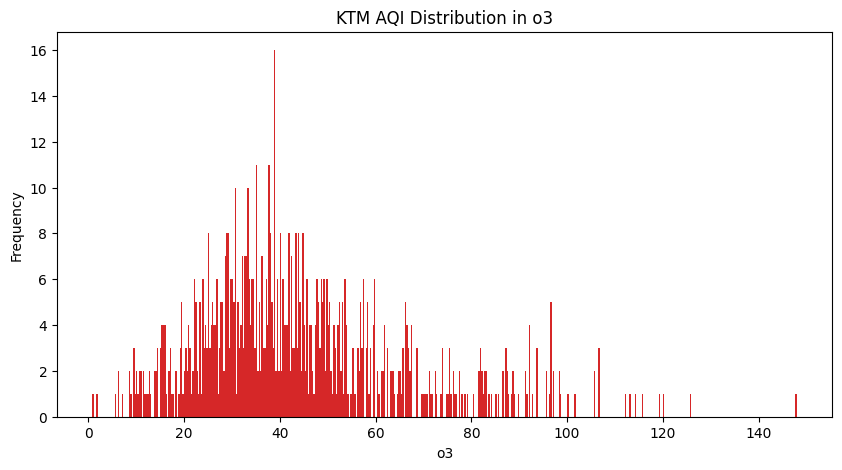

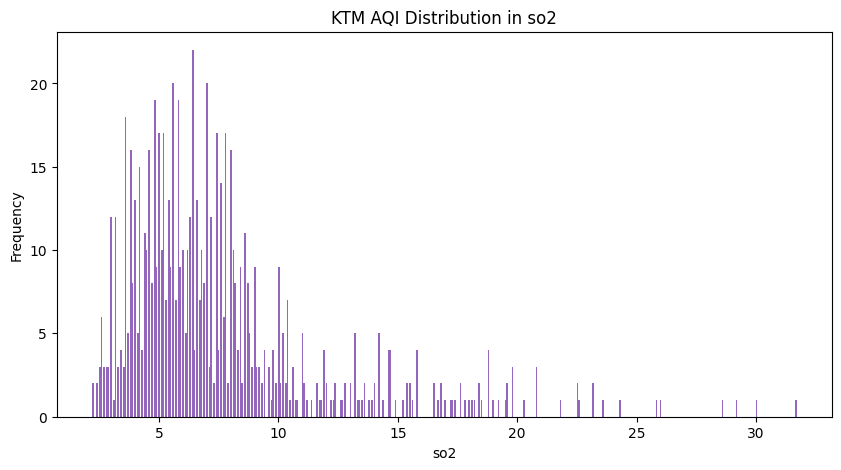

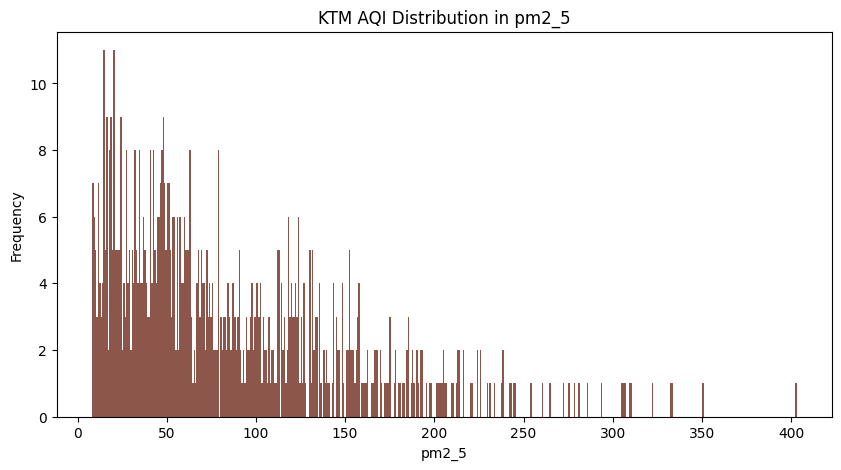

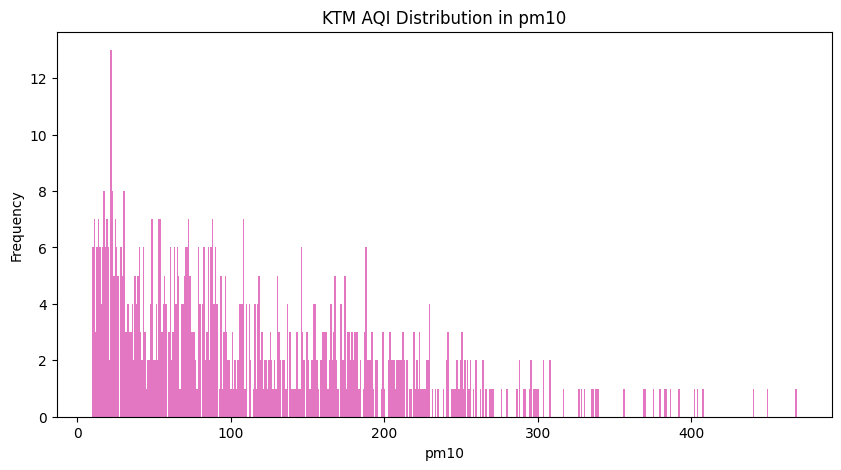

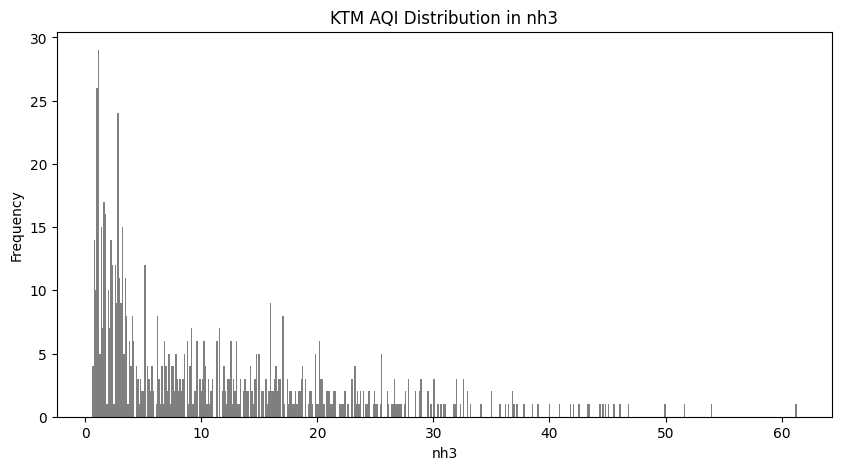

In [321]:

# Loop through all target variables and create separate histograms
for i, target in enumerate(TARGETS):
    plt.figure(figsize=(10, 5))
    
    df[target].plot(kind='hist', bins=500, color=color_palette[i], title=f'KTM AQI Distribution in {target}')
    
    plt.xlabel(target)
    plt.ylabel("Frequency")
    plt.show()

#bins represent equal intervals into which the data is divided

In [322]:
import numpy as np

outliers = {}

for target in TARGETS:
    Q1 = df[target].quantile(0.25)
    Q3 = df[target].quantile(0.75)
    IQR = Q3 - Q1  # Interquartile Range
    
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    
    # Find outliers
    outliers[target] = df[(df[target] < lower_bound) | (df[target] > upper_bound)]
    
    print(f"\n🔹 Outliers detected in {target}: {len(outliers[target])} rows")
    print(f"Lower Bound: {lower_bound}, Upper Bound: {upper_bound}")


🔹 Outliers detected in co: 19 rows
Lower Bound: -529.1375, Upper Bound: 2942.3625

🔹 Outliers detected in no: 36 rows
Lower Bound: -0.30000000000000004, Upper Bound: 0.5

🔹 Outliers detected in no2: 15 rows
Lower Bound: -9.462499999999995, Upper Bound: 46.2375

🔹 Outliers detected in o3: 31 rows
Lower Bound: -8.512499999999992, Upper Bound: 92.98749999999998

🔹 Outliers detected in so2: 68 rows
Lower Bound: -0.8999999999999995, Upper Bound: 14.299999999999999

🔹 Outliers detected in pm2_5: 21 rows
Lower Bound: -91.88749999999997, Upper Bound: 251.0125

🔹 Outliers detected in pm10: 15 rows
Lower Bound: -140.675, Upper Bound: 360.92499999999995

🔹 Outliers detected in nh3: 21 rows
Lower Bound: -18.362500000000004, Upper Bound: 37.53750000000001


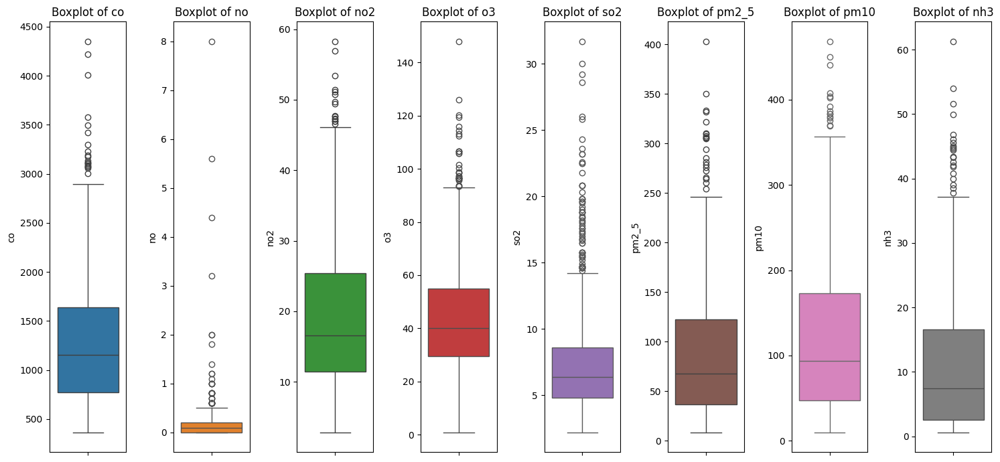

In [323]:
# Visualizing the outliers

plt.figure(figsize=(15, 7))

for i, target in enumerate(TARGETS):
    plt.subplot(1, len(TARGETS), i+1)
    sns.boxplot(y=df[target], color=color_palette[i])
    plt.title(f'Boxplot of {target}')
    
plt.tight_layout()
plt.show()


In [324]:
from scipy.stats import zscore

z_scores = df[TARGETS].apply(zscore)  # Compute Z-scores for all target variables
outliers_z = df[(z_scores > 3) | (z_scores < -3)].dropna(how="all")  

print(f"\n🔹 Outliers detected using Z-score: {len(outliers_z)} rows")



🔹 Outliers detected using Z-score: 45 rows


In [325]:
# capping the outleir to a reasonable value
for target in TARGETS:
    Q1 = df[target].quantile(0.25)
    Q3 = df[target].quantile(0.75)
    IQR = Q3 - Q1

    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    df[target] = np.where(df[target] > upper_bound, upper_bound, df[target])
    df[target] = np.where(df[target] < lower_bound, lower_bound, df[target])


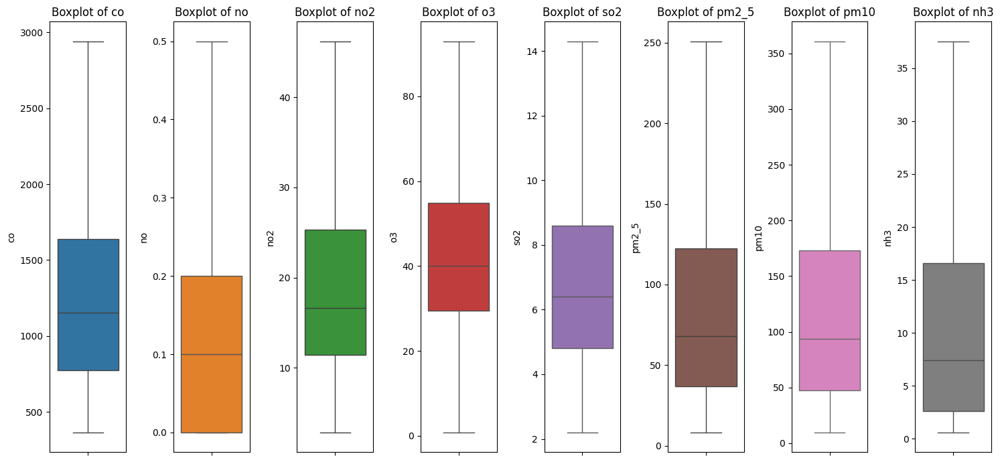

In [326]:
# Visualizing the outliers

plt.figure(figsize=(15, 7))

for i, target in enumerate(TARGETS):
    plt.subplot(1, len(TARGETS), i+1)
    sns.boxplot(y=df[target], color=color_palette[i])
    plt.title(f'Boxplot of {target}')
    
plt.tight_layout()
plt.show()


# Time series Cross Validation
Using sklearn timeseries split

In [327]:
from sklearn.model_selection import TimeSeriesSplit

In [328]:
#TimeSeriesSplit?

In [329]:
time_series_split = TimeSeriesSplit(n_splits=5)
#test_size is set to 365*3 because the data is in daily basis and then we 
#want to predict till 3 years in the future
#gap = 1 because the data set is on daily basis

In [330]:
# index of the dataframe must be sorted for the time series split to work
df =df.sort_index()

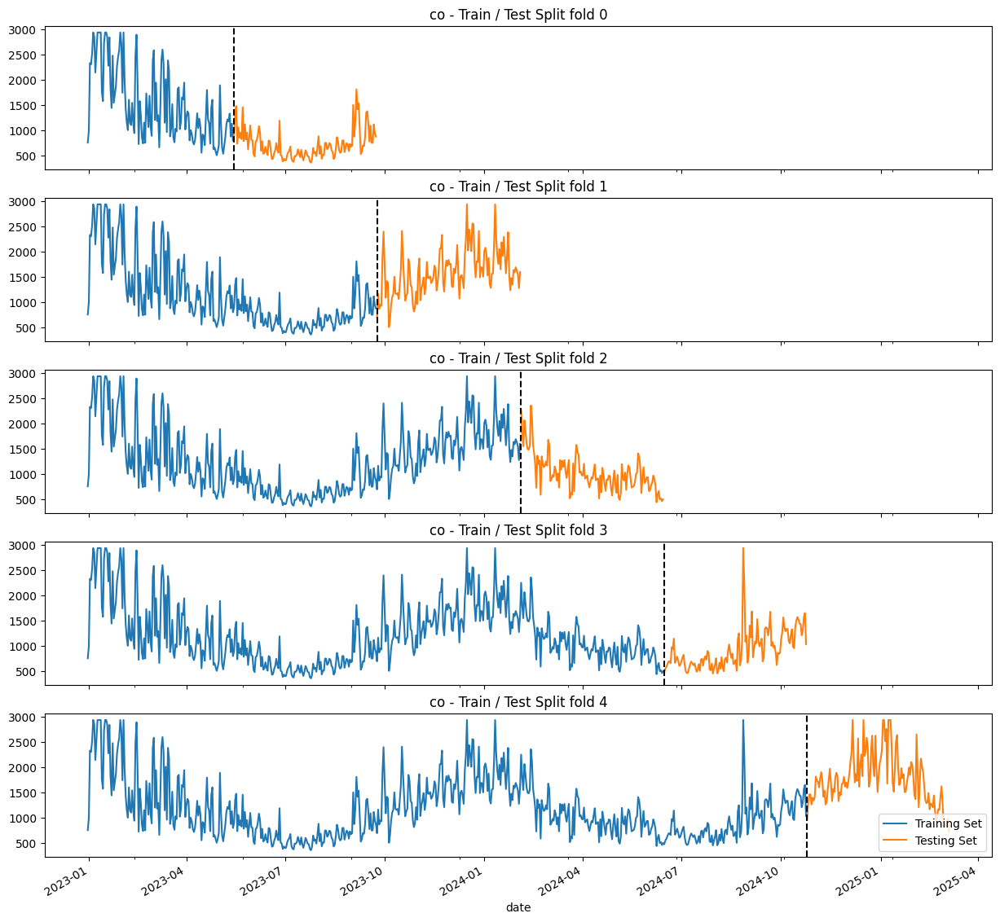

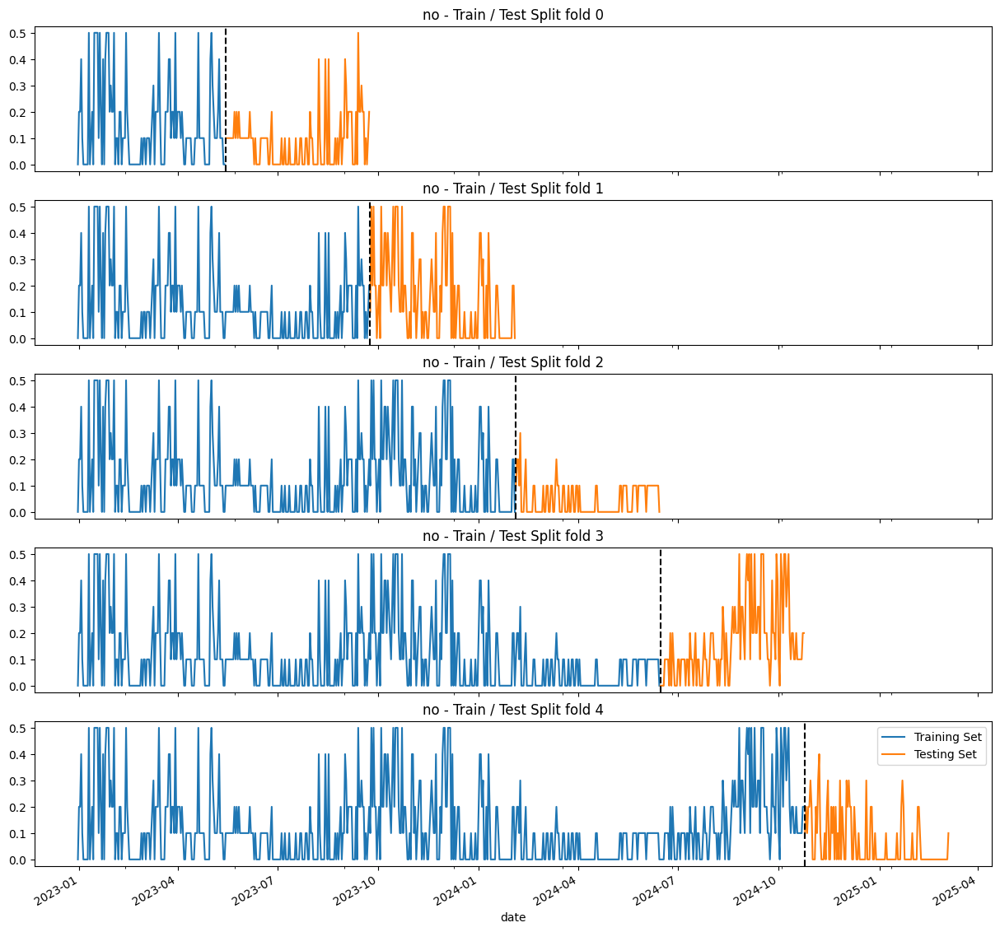

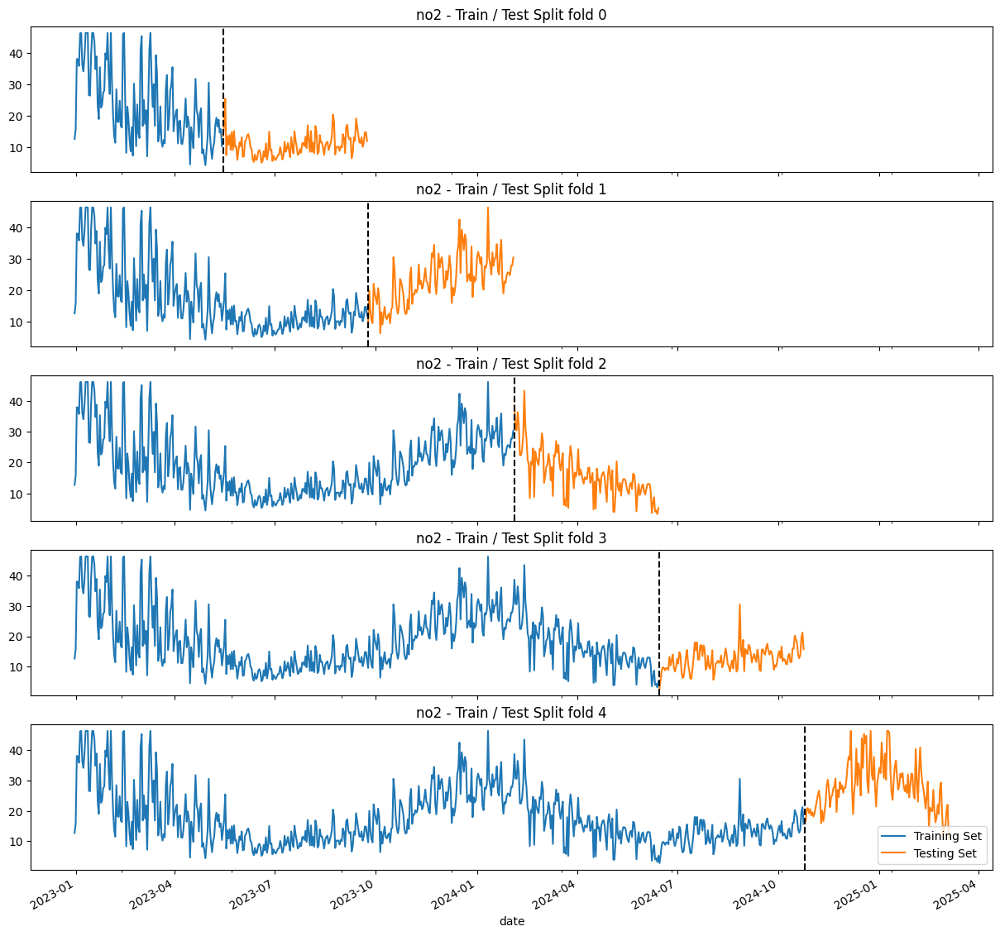

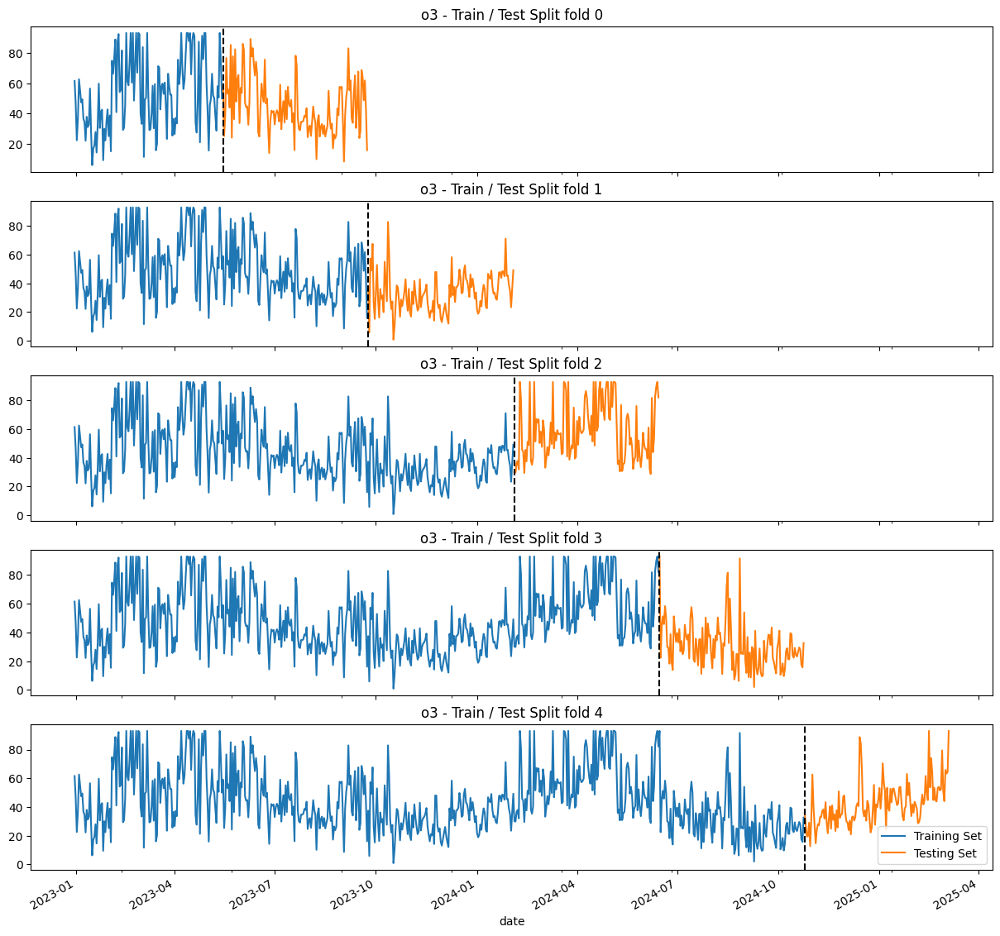

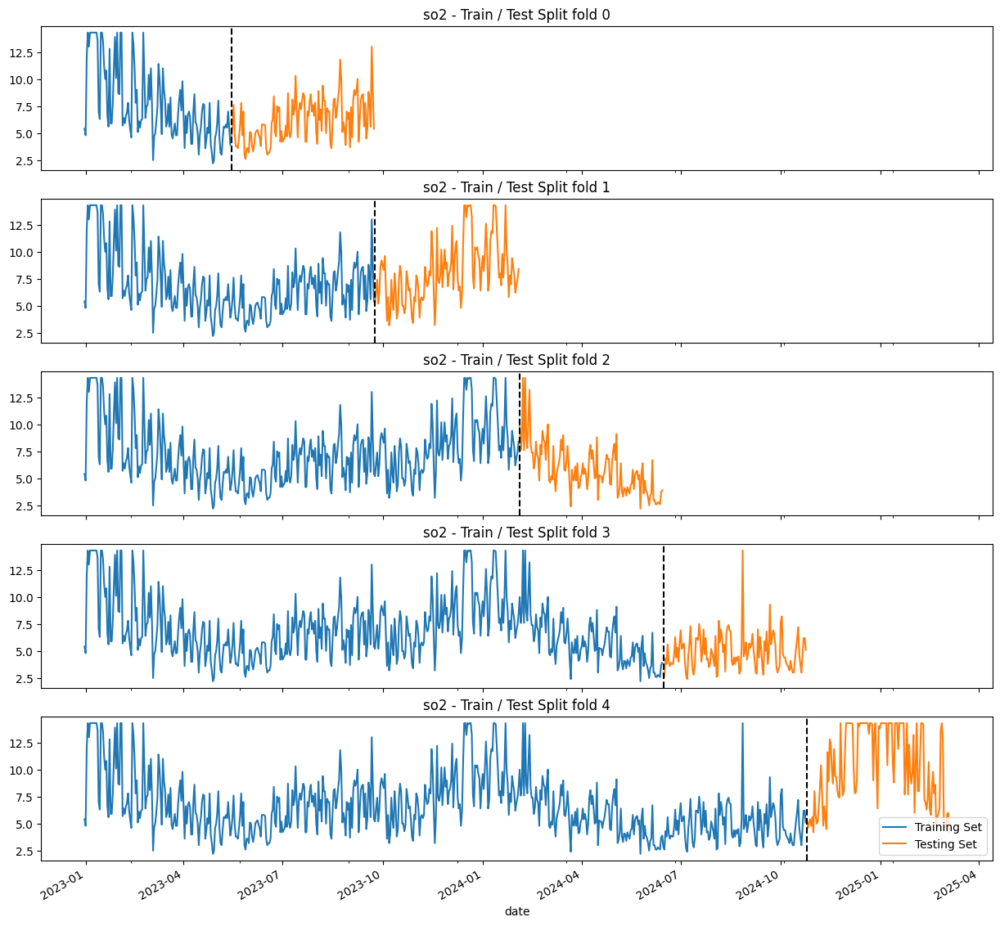

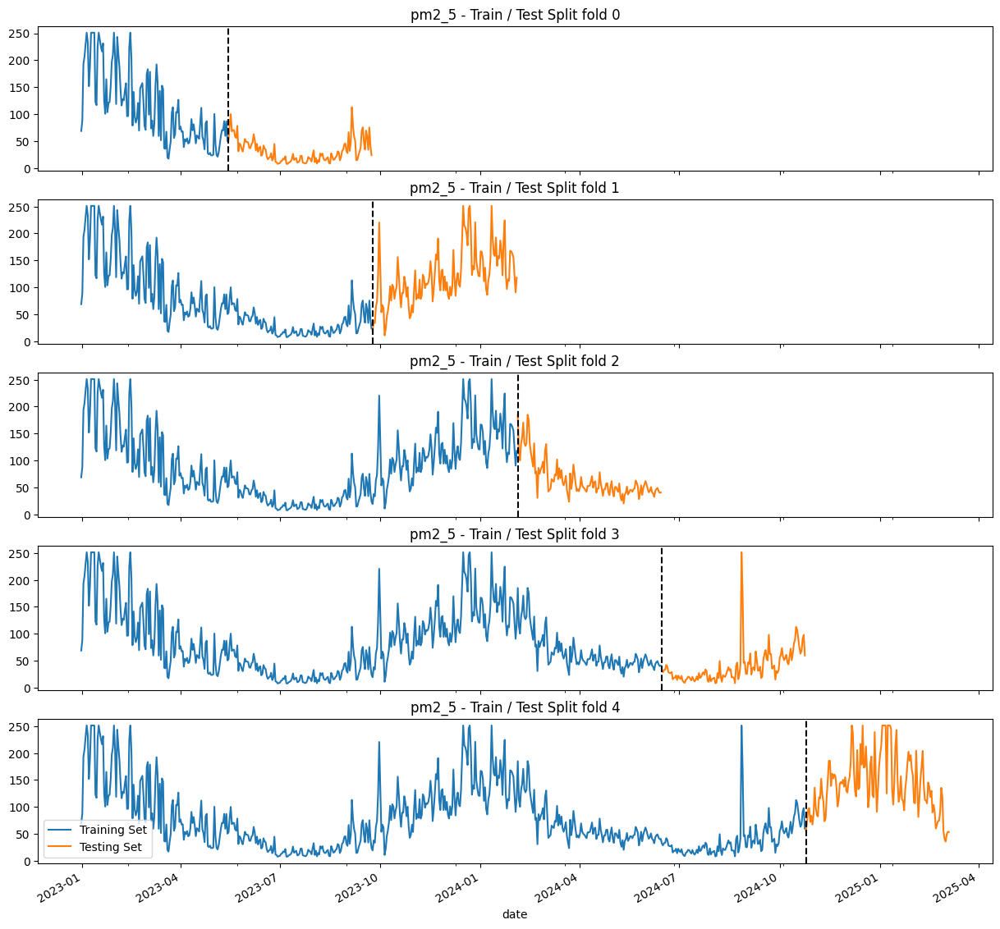

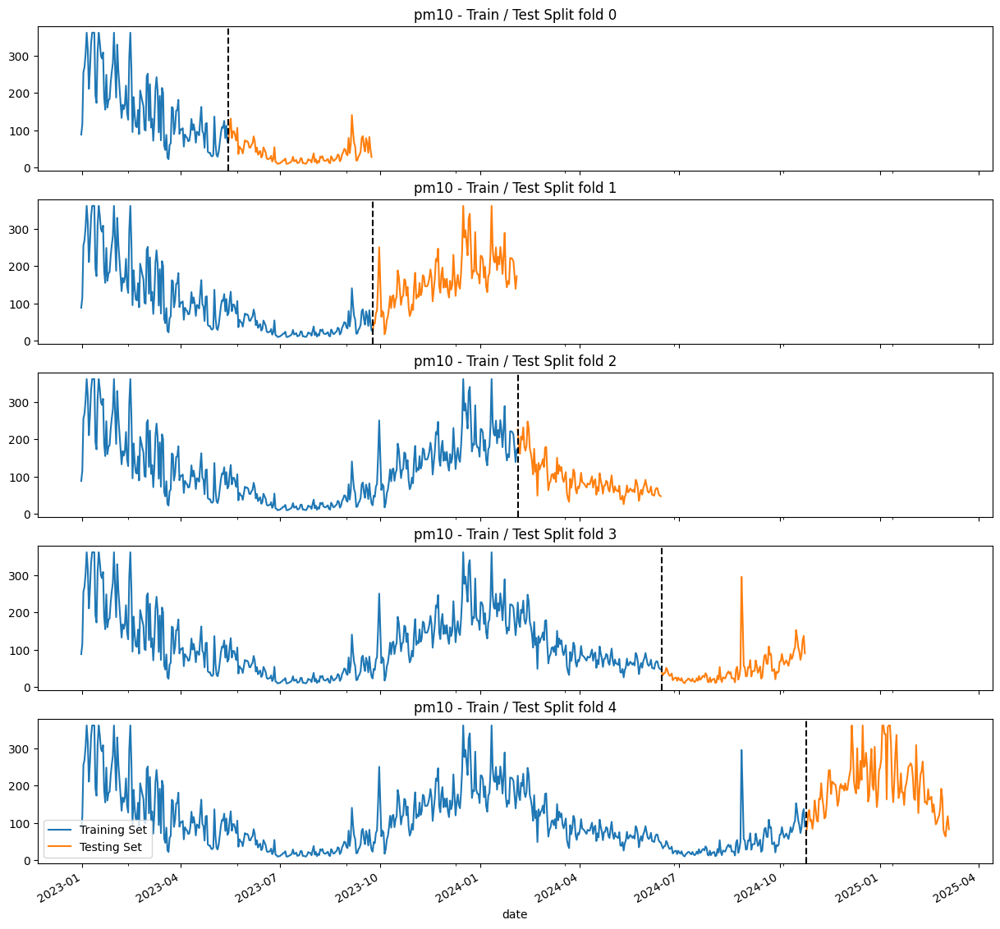

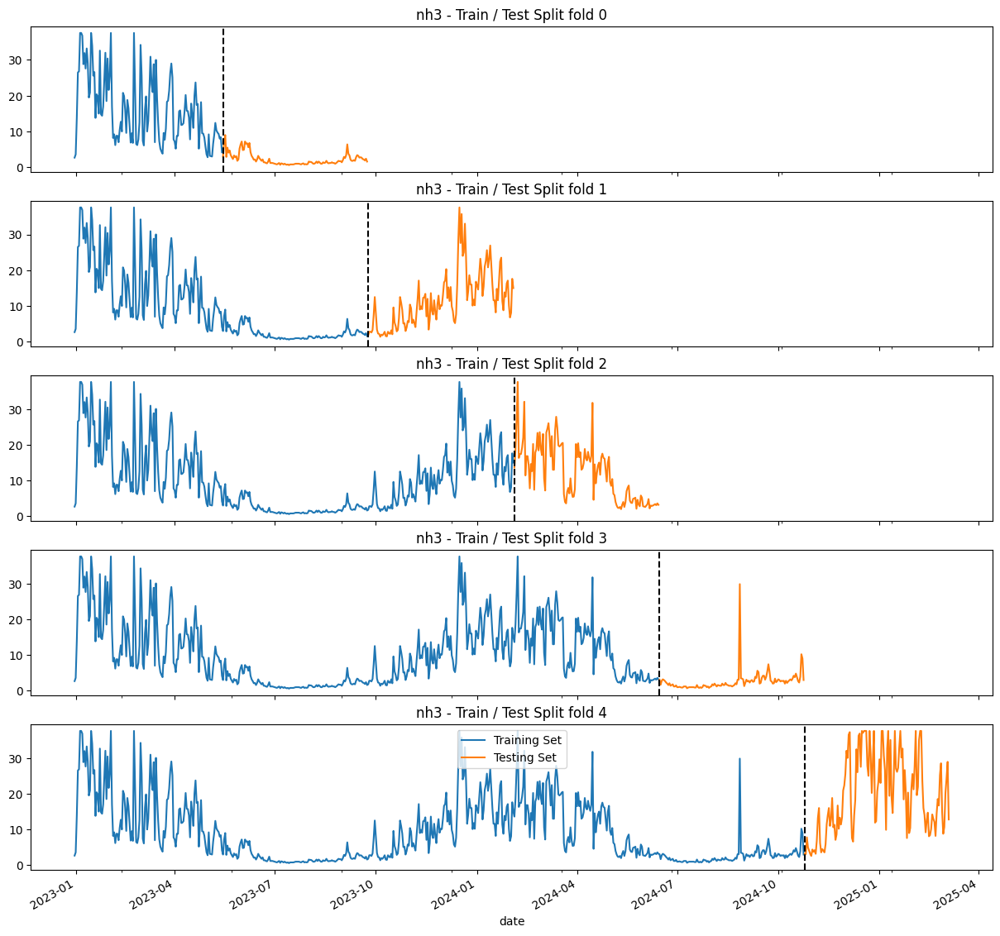

In [331]:
for target in TARGETS:  # Loop through all target variables
    fig, axs = plt.subplots(5, 1, figsize=(15, 15), sharex=True)
    
    fold = 0
    for train_idx, val_idx in time_series_split.split(df):
        train = df.iloc[train_idx]
        test = df.iloc[val_idx]

        train[target].plot(ax=axs[fold], label="Training Set", title=f"{target} - Train / Test Split fold {fold}")
        test[target].plot(ax=axs[fold], label="Testing Set")
        
        axs[fold].axvline(test.index.min(), color="black", ls="--")
        fold += 1
    
    plt.legend()
    plt.show()


## Forecasting Horizon
How far in the future to predict?

In [332]:
# create time series features based on time series index
def make_some_feature(df):
    df= df.copy()
    df['daily']= df.index.day
    df['weekly']= df.index.dayofweek
    df['quarterly']= df.index.quarter
    df['monthly']=df.index.month
    df['yearly']=df.index.year 
    df['day of year']=df.index.dayofyear
    df['week of year']=df.index.isocalendar().week
    return df

df = make_some_feature(df)
df

,aqi,co,no,no2,o3,so2,pm2_5,pm10,nh3,daily,weekly,quarterly,monthly,yearly,day of year,week of year
date,,,,,,,,,,,,,,,,
2022-12-31,300,761.0,0.0,12.7,61.5000,5.4,69.1,88.1,2.7,31,5,4,12,2022,365,52
2023-01-01,400,1001.4,0.2,15.8,46.3000,4.8,88.2,115.4,3.6,1,6,1,1,2023,1,52
2023-01-02,400,2336.5,0.2,38.0,22.5000,12.0,193.2,255.4,13.8,2,0,1,1,2023,2,1
2023-01-03,400,2309.8,0.4,37.9,36.5000,14.3,206.6,268.6,26.5,3,1,1,1,2023,3,1
2023-01-04,400,2523.4,0.1,35.8,62.6000,13.0,229.8,304.2,26.8,4,2,1,1,2023,4,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-03-01,400,851.2,0.0,14.8,44.0000,4.7,41.3,69.8,10.7,1,5,1,3,2025,60,9
2025-03-02,300,834.4,0.0,15.2,65.8000,4.8,36.2,63.5,20.1,2,6,1,3,2025,61,9
2025-03-03,400,961.3,0.0,20.0,63.3000,5.9,49.0,97.8,24.2,3,0,1,3,2025,62,10


# Lag Features
look back in the past to x days and use the target value in that many days in the past as a new feature to feed in the model

In [333]:
def add_lags(df):
    
    for col in TARGETS:
        mapped_target = df[col].to_dict()
        # subtract time delta (some days into the past) from index
        # all multples of 7 ( 364, 728,1092) to get easy dicision
        df[f'one_year_lag_{col}'] = (df.index - pd.Timedelta('364 days')).map(mapped_target)
        df[f'two_year_lag_{col}'] = (df.index - pd.Timedelta('728 days')).map(mapped_target)
        df[f'three_year_lag_{col}'] = (df.index - pd.Timedelta('1092 days')).map(mapped_target)

    return df

In [334]:
df = add_lags(df)
df.tail()

,aqi,co,no,no2,o3,so2,pm2_5,pm10,nh3,daily,...,three_year_lag_so2,one_year_lag_pm2_5,two_year_lag_pm2_5,three_year_lag_pm2_5,one_year_lag_pm10,two_year_lag_pm10,three_year_lag_pm10,one_year_lag_nh3,two_year_lag_nh3,three_year_lag_nh3
date,,,,,,,,,,,,,,,,,,,,,
2025-03-01,400,851.2,0.0,14.8,44.0000,4.7,41.3,69.8,10.7,1,...,NaN,84.6,178.6,NaN,114.8,222.9,NaN,10.6,6.1,NaN
2025-03-02,300,834.4,0.0,15.2,65.8000,4.8,36.2,63.5,20.1,2,...,NaN,42.9,73.7,NaN,63.4,107.0,NaN,7.2,16.1,NaN
2025-03-03,400,961.3,0.0,20.0,63.3000,5.9,49.0,97.8,24.2,3,...,NaN,45.8,88.6,NaN,81.6,130.8,NaN,23.4,19.8,NaN
2025-03-04,400,994.7,0.0,22.0,64.4000,6.0,54.2,118.0,28.9,4,...,NaN,48.2,60.0,NaN,87.8,71.5,NaN,24.5,10.0,NaN
2025-03-05,400,721.0,0.1,11.0,92.9875,4.2,53.9,82.8,12.8,5,...,NaN,65.8,82.0,NaN,105.0,123.3,NaN,26.0,13.0,NaN


# Train using Cross Validation

In [335]:
df.columns

Index(['aqi', 'co', 'no', 'no2', 'o3', 'so2', 'pm2_5', 'pm10', 'nh3', 'daily',
       'weekly', 'quarterly', 'monthly', 'yearly', 'day of year',
       'week of year', 'one_year_lag_co', 'two_year_lag_co',
       'three_year_lag_co', 'one_year_lag_no', 'two_year_lag_no',
       'three_year_lag_no', 'one_year_lag_no2', 'two_year_lag_no2',
       'three_year_lag_no2', 'one_year_lag_o3', 'two_year_lag_o3',
       'three_year_lag_o3', 'one_year_lag_so2', 'two_year_lag_so2',
       'three_year_lag_so2', 'one_year_lag_pm2_5', 'two_year_lag_pm2_5',
       'three_year_lag_pm2_5', 'one_year_lag_pm10', 'two_year_lag_pm10',
       'three_year_lag_pm10', 'one_year_lag_nh3', 'two_year_lag_nh3',
       'three_year_lag_nh3'],
      dtype='object')

In [336]:

# Create storage for predictions and scores
preds = {target: [] for target in TARGETS}
scores = {target: [] for target in TARGETS}

# Time Series Split
n_splits = 5  # Adjust based on data size
time_series_split = TimeSeriesSplit(n_splits=n_splits)

# Define hyperparameter grid
param_grid = {
    "estimator__n_estimators": [200, 500, 1000],  
    "estimator__learning_rate": [0.01, 0.05, 0.1],  
    "estimator__max_depth": [5, 7, 10],  
    "estimator__subsample": [0.7, 0.8, 0.9],  
    "estimator__colsample_bytree": [0.7, 0.8, 0.9]  
}

# Initialize base XGBoost model
base_model = xgb.XGBRegressor(objective="reg:squarederror")

# Wrap it in MultiOutputRegressor
multi_output_model = MultiOutputRegressor(base_model)

# Perform Grid Search
grid_search = GridSearchCV(multi_output_model, param_grid, cv=3, scoring="r2", verbose=1, n_jobs=-1)

# Iterate through time series splits
for fold, (train_idx, val_idx) in enumerate(time_series_split.split(df)):
    print(f"\n🔹 Processing Fold {fold+1}/{n_splits}")

    train = df.iloc[train_idx]
    test = df.iloc[val_idx]

    # Feature Engineering
    train = make_some_feature(train)
    test = make_some_feature(test)

    # Add lag features
    train = add_lags(train)
    test = add_lags(test)

    # Feature Selection
    FEATURES = ['daily',
       'weekly', 'quarterly', 'monthly', 'yearly', 'day of year',
       'week of year', 'one_year_lag_co', 'two_year_lag_co',
       'three_year_lag_co', 'one_year_lag_no', 'two_year_lag_no',
       'three_year_lag_no', 'one_year_lag_no2', 'two_year_lag_no2',
       'three_year_lag_no2', 'one_year_lag_o3', 'two_year_lag_o3',
       'three_year_lag_o3', 'one_year_lag_so2', 'two_year_lag_so2',
       'three_year_lag_so2', 'one_year_lag_pm2_5', 'two_year_lag_pm2_5',
       'three_year_lag_pm2_5', 'one_year_lag_pm10', 'two_year_lag_pm10',
       'three_year_lag_pm10', 'one_year_lag_nh3', 'two_year_lag_nh3',
       'three_year_lag_nh3']

    # Train and Test Data
    X_train = train[FEATURES]
    y_train = train[TARGETS]  # Multiple targets

    X_test = test[FEATURES]
    y_test = test[TARGETS]  # Multiple targets

    # Fit Grid Search on first fold (optional)
    if fold == 0:
        print("🔍 Running Grid Search for best parameters...")
        grid_search.fit(X_train, y_train)
        best_params = grid_search.best_params_
        print(f"✅ Best Parameters: {best_params}")

        # Update model with best parameters
        best_base_model = xgb.XGBRegressor(objective="reg:squarederror", **{
            k.replace("estimator__", ""): v for k, v in best_params.items()
        })
        multi_output_model = MultiOutputRegressor(best_base_model)

    # Train Final Model with Best Parameters
    print(f"🚀 Training MultiOutput XGBoost on Fold {fold+1}...")
    multi_output_model.fit(X_train, y_train)

    # Predictions
    y_pred = multi_output_model.predict(X_test)

    # Store Predictions and Scores
    for i, target in enumerate(TARGETS):
        preds[target].append(y_pred[:, i])
        scores[target].append(np.sqrt(mean_squared_error(y_test[target], y_pred[:, i])))

# Final Performance Summary
final_scores = {target: np.mean(scores[target]) for target in TARGETS}
print("\n🔹 **Final RMSE Scores:**", final_scores)



🔹 Processing Fold 1/5
🔍 Running Grid Search for best parameters...
Fitting 3 folds for each of 243 candidates, totalling 729 fits
✅ Best Parameters: {'estimator__colsample_bytree': 0.7, 'estimator__learning_rate': 0.01, 'estimator__max_depth': 5, 'estimator__n_estimators': 500, 'estimator__subsample': 0.7}
🚀 Training MultiOutput XGBoost on Fold 1...

🔹 Processing Fold 2/5
🚀 Training MultiOutput XGBoost on Fold 2...

🔹 Processing Fold 3/5
🚀 Training MultiOutput XGBoost on Fold 3...

🔹 Processing Fold 4/5
🚀 Training MultiOutput XGBoost on Fold 4...

🔹 Processing Fold 5/5
🚀 Training MultiOutput XGBoost on Fold 5...

🔹 **Final RMSE Scores:** {'co': np.float64(461.58107139218384), 'no': np.float64(0.14238289455987846), 'no2': np.float64(6.7319486984352555), 'o3': np.float64(20.028646955976047), 'so2': np.float64(2.466854729293003), 'pm2_5': np.float64(43.12208954222417), 'pm10': np.float64(57.601925231260395), 'nh3': np.float64(7.209980538089459)}


In [337]:
# Create a DataFrame for results
results_df = pd.DataFrame(results)
print("\nModel Performance Summary:")
print(results_df)


Model Performance Summary:
  Target         MAE            MSE   R² Score
0     co  408.839804  343418.955437  -0.001973
1     no    0.242188       0.514350 -19.461960
2    no2    6.484191      79.628154   0.104317
3     o3   19.687110     670.618077  -0.432467
4    so2    3.144198      18.919548   0.236905
5  pm2_5   34.270911    2680.587856   0.341489
6   pm10   42.461005    3873.857623   0.464384
7    nh3    6.391851     101.152158   0.178247


## Predicting Future
- retrain model on all data
- create an empty dataframe from future data range
- Run the new data through the `make_some_feature()` and `add_lags()` functions

In [338]:
# # train the model on the entire dataset
# df = make_some_feature(df)

# FEATURES = ['daily',
#        'weekly', 'quarterly', 'monthly', 'yearly', 'day of year',
#        'week of year', 'one_year_lag_co', 'two_year_lag_co',
#        'three_year_lag_co', 'one_year_lag_no', 'two_year_lag_no',
#        'three_year_lag_no', 'one_year_lag_no2', 'two_year_lag_no2',
#        'three_year_lag_no2', 'one_year_lag_o3', 'two_year_lag_o3',
#        'three_year_lag_o3', 'one_year_lag_so2', 'two_year_lag_so2',
#        'three_year_lag_so2', 'one_year_lag_pm2_5', 'two_year_lag_pm2_5',
#        'three_year_lag_pm2_5', 'one_year_lag_pm10', 'two_year_lag_pm10',
#        'three_year_lag_pm10', 'one_year_lag_nh3', 'two_year_lag_nh3',
#        'three_year_lag_nh3']


# X_whole = df[FEATURES]
# y_whole = df[TARGETS]

# # prediction_model = xgb.XGBRegressor(base_score=0.5, booster='gbtree',n_estimators = 200,early_stopping_rounds=50,objective='reg:linear',max_depth=3,learning_rate=0.01)

# # prediction_model.fit(X_whole, y_whole,eval_set=[(X_whole,y_whole)],verbose=100)
# multi_output_model.fit(X_whole, y_whole,eval_set=[(X_whole,y_whole)],verbose=100)

In [339]:
df.index.max()

Timestamp('2025-03-05 00:00:00')

In [340]:
# make new data using pandas
# create a future dataframe
future_date = pd.date_range('2025-02-20','2026-02-19')
future_df = pd.DataFrame(index=future_date)
# indicate it is future date
future_df['isFuture'] = True
df['isFuture'] = False

# merge the future and present dataframes
df_merged = pd.concat([df, future_df])

In [341]:
df_merged = make_some_feature(df_merged)
df_merged = add_lags(df_merged)

In [342]:
df_merged

,aqi,co,no,no2,o3,so2,pm2_5,pm10,nh3,daily,...,one_year_lag_pm2_5,two_year_lag_pm2_5,three_year_lag_pm2_5,one_year_lag_pm10,two_year_lag_pm10,three_year_lag_pm10,one_year_lag_nh3,two_year_lag_nh3,three_year_lag_nh3,isFuture
2022-12-31,300.0,761.0,0.0,12.7,61.5,5.4,69.1,88.1,2.7,31,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False
2023-01-01,400.0,1001.4,0.2,15.8,46.3,4.8,88.2,115.4,3.6,1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False
2023-01-02,400.0,2336.5,0.2,38.0,22.5,12.0,193.2,255.4,13.8,2,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False
2023-01-03,400.0,2309.8,0.4,37.9,36.5,14.3,206.6,268.6,26.5,3,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False
2023-01-04,400.0,2523.4,0.1,35.8,62.6,13.0,229.8,304.2,26.8,4,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2026-02-15,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,15,...,118.8,89.0,84.6,165.6,105.7,110.2,8.4,7.8,11.6000,True
2026-02-16,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,16,...,129.9,132.1,92.7,170.0,174.1,107.7,10.1,14.6,6.9000,True
2026-02-17,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,17,...,90.0,76.6,121.0,128.6,113.0,154.0,14.2,12.6,9.5000,True
2026-02-18,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,18,...,104.0,80.2,69.8,149.7,131.7,89.5,13.0,20.2,6.8000,True


In [343]:
future_with_features = df_merged.query('isFuture').copy()

In [344]:
future_with_features

,aqi,co,no,no2,o3,so2,pm2_5,pm10,nh3,daily,...,one_year_lag_pm2_5,two_year_lag_pm2_5,three_year_lag_pm2_5,one_year_lag_pm10,two_year_lag_pm10,three_year_lag_pm10,one_year_lag_nh3,two_year_lag_nh3,three_year_lag_nh3,isFuture
2025-02-20,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,20,...,31.2,148.1,NaN,48.8,206.2,NaN,7.4,37.5375,NaN,True
2025-02-21,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,21,...,86.8,NaN,NaN,136.3,NaN,NaN,17.8,NaN,NaN,True
2025-02-22,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,22,...,75.8,157.8,NaN,118.5,176.9,NaN,18.8,6.5000,NaN,True
2025-02-23,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,23,...,83.5,123.3,NaN,129.3,164.4,NaN,23.3,6.2000,NaN,True
2025-02-24,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,24,...,88.2,78.6,NaN,134.2,101.4,NaN,18.4,7.8000,NaN,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2026-02-15,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,15,...,118.8,89.0,84.6,165.6,105.7,110.2,8.4,7.8000,11.6000,True
2026-02-16,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,16,...,129.9,132.1,92.7,170.0,174.1,107.7,10.1,14.6000,6.9000,True
2026-02-17,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,17,...,90.0,76.6,121.0,128.6,113.0,154.0,14.2,12.6000,9.5000,True
2026-02-18,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,18,...,104.0,80.2,69.8,149.7,131.7,89.5,13.0,20.2000,6.8000,True


### Predict the future

In [345]:
future_with_features[['predicted co', 'predicted no', 'predicted no2', 'predicted o3', 'predicted so2', 'predicted pm2_5', 'predicted pm10', 'predicted nh3']]=multi_output_model.predict(future_with_features[FEATURES])

In [346]:
future_with_features

,aqi,co,no,no2,o3,so2,pm2_5,pm10,nh3,daily,...,three_year_lag_nh3,isFuture,predicted co,predicted no,predicted no2,predicted o3,predicted so2,predicted pm2_5,predicted pm10,predicted nh3
2025-02-20,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,20,...,NaN,True,1136.131592,0.017847,19.061895,56.212383,7.926827,100.490303,136.857117,15.208811
2025-02-21,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,21,...,NaN,True,1107.407227,0.005462,17.933708,62.007740,6.627556,79.959404,119.231537,13.672350
2025-02-22,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,22,...,NaN,True,1053.718384,-0.006256,15.631016,66.151382,6.708424,78.657494,111.360077,14.193893
2025-02-23,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,23,...,NaN,True,1082.239868,0.001143,17.528343,67.631561,7.089861,79.383202,119.664940,15.171483
2025-02-24,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,24,...,NaN,True,1185.902832,0.019663,20.522354,57.823868,7.864565,83.294495,124.201591,18.364235
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2026-02-15,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,15,...,11.6000,True,1282.396240,0.029061,20.881649,55.411396,7.726011,116.808548,157.991486,18.267885
2026-02-16,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,16,...,6.9000,True,1383.894287,0.036355,22.584044,46.537674,8.265058,114.456902,156.912445,18.036560
2026-02-17,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,17,...,9.5000,True,1258.920166,0.035100,20.689810,49.438801,7.473046,107.570419,146.405075,15.779785
2026-02-18,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,18,...,6.8000,True,1167.502197,0.030204,19.012611,55.129761,6.905583,88.506683,122.707443,14.626775


In [347]:
future_with_features.head()

,aqi,co,no,no2,o3,so2,pm2_5,pm10,nh3,daily,...,three_year_lag_nh3,isFuture,predicted co,predicted no,predicted no2,predicted o3,predicted so2,predicted pm2_5,predicted pm10,predicted nh3
2025-02-20,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,20,...,NaN,True,1136.131592,0.017847,19.061895,56.212383,7.926827,100.490303,136.857117,15.208811
2025-02-21,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,21,...,NaN,True,1107.407227,0.005462,17.933708,62.007740,6.627556,79.959404,119.231537,13.672350
2025-02-22,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,22,...,NaN,True,1053.718384,-0.006256,15.631016,66.151382,6.708424,78.657494,111.360077,14.193893
2025-02-23,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,23,...,NaN,True,1082.239868,0.001143,17.528343,67.631561,7.089861,79.383202,119.664940,15.171483
2025-02-24,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,24,...,NaN,True,1185.902832,0.019663,20.522354,57.823868,7.864565,83.294495,124.201591,18.364235


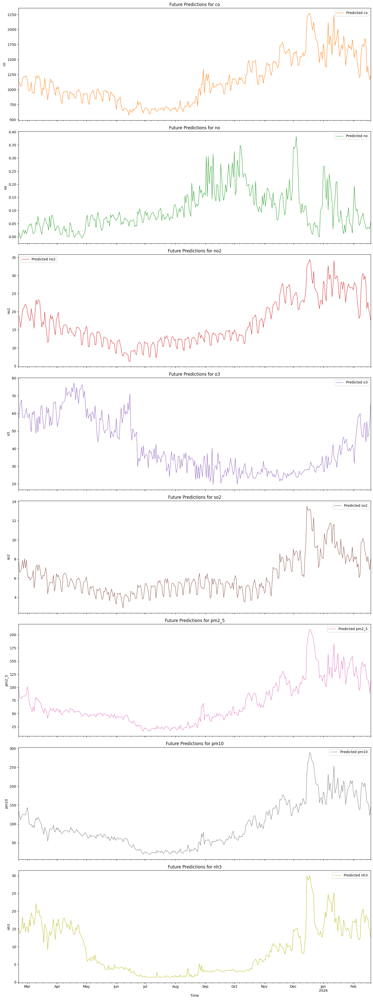

In [348]:
fig, ax = plt.subplots(len(TARGETS), 1, figsize=(15, 5 * len(TARGETS)), sharex=True)  

for i, target in enumerate(TARGETS):
    future_with_features[f'predicted {target}'].plot(ax=ax[i], color=color_palette[i + 1], lw=1, title=f'Future Predictions for {target}')
    ax[i].set_ylabel(target)
    ax[i].legend([f'Predicted {target}'])

plt.xlabel('Time')  
plt.tight_layout()  
plt.show()


In [349]:
df_merged.tail()

,aqi,co,no,no2,o3,so2,pm2_5,pm10,nh3,daily,...,one_year_lag_pm2_5,two_year_lag_pm2_5,three_year_lag_pm2_5,one_year_lag_pm10,two_year_lag_pm10,three_year_lag_pm10,one_year_lag_nh3,two_year_lag_nh3,three_year_lag_nh3,isFuture
2026-02-15,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,15,...,118.8,89.0,84.6,165.6,105.7,110.2,8.4,7.8,11.6000,True
2026-02-16,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,16,...,129.9,132.1,92.7,170.0,174.1,107.7,10.1,14.6,6.9000,True
2026-02-17,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,17,...,90.0,76.6,121.0,128.6,113.0,154.0,14.2,12.6,9.5000,True
2026-02-18,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,18,...,104.0,80.2,69.8,149.7,131.7,89.5,13.0,20.2,6.8000,True
2026-02-19,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,19,...,NaN,31.2,148.1,NaN,48.8,206.2,NaN,7.4,37.5375,True


In [350]:
future_with_features.tail()

,aqi,co,no,no2,o3,so2,pm2_5,pm10,nh3,daily,...,three_year_lag_nh3,isFuture,predicted co,predicted no,predicted no2,predicted o3,predicted so2,predicted pm2_5,predicted pm10,predicted nh3
2026-02-15,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,15,...,11.6000,True,1282.396240,0.029061,20.881649,55.411396,7.726011,116.808548,157.991486,18.267885
2026-02-16,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,16,...,6.9000,True,1383.894287,0.036355,22.584044,46.537674,8.265058,114.456902,156.912445,18.036560
2026-02-17,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,17,...,9.5000,True,1258.920166,0.035100,20.689810,49.438801,7.473046,107.570419,146.405075,15.779785
2026-02-18,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,18,...,6.8000,True,1167.502197,0.030204,19.012611,55.129761,6.905583,88.506683,122.707443,14.626775
2026-02-19,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,19,...,37.5375,True,1234.347778,0.056021,17.606003,65.540123,8.013550,112.157616,145.778168,12.487971


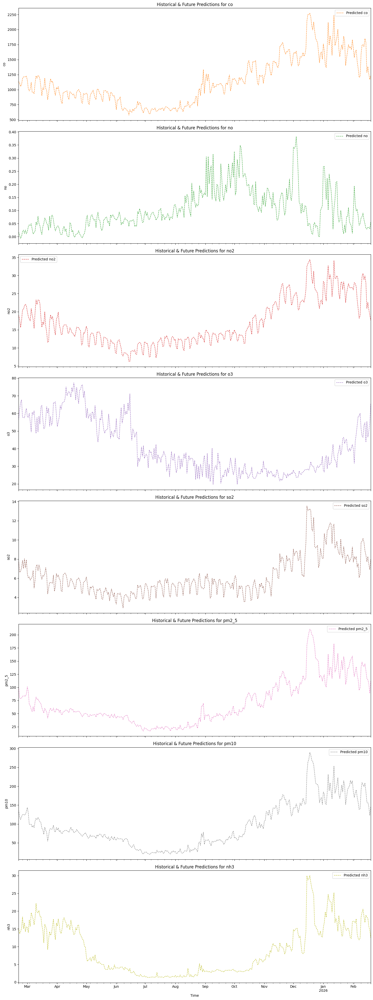

In [357]:
fig, ax = plt.subplots(len(TARGETS), 1, figsize=(15, 5 * len(TARGETS)), sharex=True)  

for i, target in enumerate(TARGETS):
  # Plot predicted future values
    future_with_features[f'predicted {target}'].plot(ax=ax[i], color=color_palette[i + 1], lw=1, linestyle='dashed', label=f'Predicted {target}')
    
    ax[i].set_ylabel(target)
    ax[i].set_title(f'Historical & Future Predictions for {target}')
    ax[i].legend()

plt.xlabel('Time')  
plt.tight_layout()  
plt.show()


### Saving the model for future so it doesn't have to retrained everytime

In [352]:
for i, target in enumerate(TARGETS):
    multi_output_model.estimators_[i].save_model(f"AQI_predictor_model_{target}.json")


## Final Output

In [353]:
df_merged.tail(n=353)

,aqi,co,no,no2,o3,so2,pm2_5,pm10,nh3,daily,...,one_year_lag_pm2_5,two_year_lag_pm2_5,three_year_lag_pm2_5,one_year_lag_pm10,two_year_lag_pm10,three_year_lag_pm10,one_year_lag_nh3,two_year_lag_nh3,three_year_lag_nh3,isFuture
2025-03-04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4,...,48.2,60.0,NaN,87.8,71.5,NaN,24.5,10.0,NaN,True
2025-03-05,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5,...,65.8,82.0,NaN,105.0,123.3,NaN,26.0,13.0,NaN,True
2025-03-06,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6,...,63.2,150.9,NaN,107.0,208.7,NaN,22.2,21.5,NaN,True
2025-03-07,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7,...,61.2,192.3,NaN,94.0,241.8,NaN,16.7,30.9,NaN,True
2025-03-08,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8,...,74.3,159.2,NaN,109.9,205.7,NaN,22.4,23.2,NaN,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2026-02-15,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,15,...,118.8,89.0,84.6,165.6,105.7,110.2,8.4,7.8,11.6000,True
2026-02-16,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,16,...,129.9,132.1,92.7,170.0,174.1,107.7,10.1,14.6,6.9000,True
2026-02-17,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,17,...,90.0,76.6,121.0,128.6,113.0,154.0,14.2,12.6,9.5000,True
2026-02-18,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,18,...,104.0,80.2,69.8,149.7,131.7,89.5,13.0,20.2,6.8000,True


In [354]:
future_with_features.head()

,aqi,co,no,no2,o3,so2,pm2_5,pm10,nh3,daily,...,three_year_lag_nh3,isFuture,predicted co,predicted no,predicted no2,predicted o3,predicted so2,predicted pm2_5,predicted pm10,predicted nh3
2025-02-20,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,20,...,NaN,True,1136.131592,0.017847,19.061895,56.212383,7.926827,100.490303,136.857117,15.208811
2025-02-21,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,21,...,NaN,True,1107.407227,0.005462,17.933708,62.007740,6.627556,79.959404,119.231537,13.672350
2025-02-22,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,22,...,NaN,True,1053.718384,-0.006256,15.631016,66.151382,6.708424,78.657494,111.360077,14.193893
2025-02-23,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,23,...,NaN,True,1082.239868,0.001143,17.528343,67.631561,7.089861,79.383202,119.664940,15.171483
2025-02-24,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,24,...,NaN,True,1185.902832,0.019663,20.522354,57.823868,7.864565,83.294495,124.201591,18.364235


In [355]:

df_merged = df_merged[~df_merged.index.duplicated(keep='first')]
future_with_features = future_with_features[~future_with_features.index.duplicated(keep='first')]

final_df = pd.concat([df_merged, future_with_features], axis=1)
final_df.tail(n=355)


,aqi,co,no,no2,o3,so2,pm2_5,pm10,nh3,daily,...,three_year_lag_nh3,isFuture,predicted co,predicted no,predicted no2,predicted o3,predicted so2,predicted pm2_5,predicted pm10,predicted nh3
2025-03-02,300.0,834.4,0.0,15.2,65.8000,4.8,36.2,63.5,20.1,2,...,NaN,True,1012.723816,0.037992,18.670649,57.697414,6.040953,91.623871,128.390121,13.979424
2025-03-03,400.0,961.3,0.0,20.0,63.3000,5.9,49.0,97.8,24.2,3,...,NaN,True,977.485229,0.045639,17.954765,60.020428,6.139782,67.012863,98.846695,17.552706
2025-03-04,400.0,994.7,0.0,22.0,64.4000,6.0,54.2,118.0,28.9,4,...,NaN,True,1013.693787,0.043043,17.460566,55.017910,5.805590,65.926918,99.204033,15.714682
2025-03-05,400.0,721.0,0.1,11.0,92.9875,4.2,53.9,82.8,12.8,5,...,NaN,True,1122.186279,0.049809,20.872953,49.458279,5.980945,57.813953,99.122803,19.537443
2025-03-06,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6,...,NaN,True,955.812683,0.028732,19.011677,60.607830,6.150413,53.675358,91.426125,18.652393
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2026-02-15,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,15,...,11.6000,True,1282.396240,0.029061,20.881649,55.411396,7.726011,116.808548,157.991486,18.267885
2026-02-16,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,16,...,6.9000,True,1383.894287,0.036355,22.584044,46.537674,8.265058,114.456902,156.912445,18.036560
2026-02-17,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,17,...,9.5000,True,1258.920166,0.035100,20.689810,49.438801,7.473046,107.570419,146.405075,15.779785
2026-02-18,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,18,...,6.8000,True,1167.502197,0.030204,19.012611,55.129761,6.905583,88.506683,122.707443,14.626775


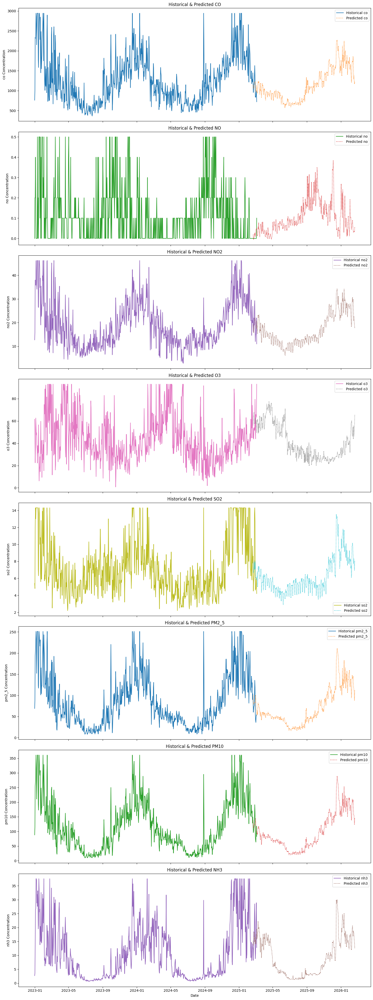

In [364]:
# Set up the color palette and create a cycle.
color_palette = sns.color_palette()  # default seaborn color palette
color_cycle = itertools.cycle(color_palette)

# Create subplots dynamically based on the number of targets.
fig, ax = plt.subplots(len(TARGETS), 1, figsize=(15, 5 * len(TARGETS)), sharex=True)
if len(TARGETS) == 1:
    ax = [ax]  # ensure ax is iterable even with one subplot

# Plot each target on its own subplot.
for i, target in enumerate(TARGETS):
    color_actual = next(color_cycle)  # Color for historical data.
    color_pred = next(color_cycle)    # Color for predicted data.
    
    # Plot historical data with a solid line and capture the first line object.
    line_hist = ax[i].plot(final_df.index, final_df[target],
                           linestyle='-', color=color_actual,
                           label=f"Historical {target}")[0]
    # Plot predicted data with a dotted line and capture the first line object.
    line_pred = ax[i].plot(final_df.index, final_df[f'predicted {target}'],
                           linestyle=':', color=color_pred,
                           label=f"Predicted {target}")[0]
    
    ax[i].set_title(f'Historical & Predicted {target.upper()}')
    ax[i].set_ylabel(f'{target} Concentration')
    # Manually add a legend with the captured line objects.
    ax[i].legend(handles=[line_hist, line_pred])

plt.xlabel('Date')
plt.tight_layout()
plt.show()